# Approach
Some code snippents are taken from the below reference link.
#Ref: https://machinelearningmastery.com/how-to-train-an-object-detection-model-with-keras/

Mask_RCNN gives 3 outputs:
1. Class_ids with Prediction score
2. Objects/Cells Bounding Box
3. Mask for Objects/Cells

# Evaluation Metrics

### mAP: Mean Average Precision
The performance of a model for an object recognition task is often evaluated using the mAP and IOU.
We are predicting bounding boxes so we can determine how well the predicted and actual bounding boxes overlap. This can be calculated by dividing the area of the overlap by the total area of both bounding boxes, or the intersection divided by the union, referred to as “intersection over union,” or IoU. A perfect bounding box prediction will have an IoU of 1.
It is standard to assume a positive prediction of a bounding box if the IoU is greater than 0.5, e.g. they overlap by 50% or more.


Precision refers to the percentage of the correctly predicted bounding boxes (IoU > 0.5) out of all bounding boxes predicted in the image. Recall is the percentage of the correctly predicted bounding boxes (IoU > 0.5) out of all objects in the image.
As we make more predictions, the recall percentage will increase, but precision will drop or become erratic as we start making false positive predictions. The recall (x) can be plotted against the precision (y) for each number of predictions to create a curve or line. We can maximize the value of each point on this line and calculate the average value of the precision or AP for each value of recall.
The average or mean of the average precision (AP) across all of the images in a dataset is called the mean average precision, or mAP.


The mask-rcnn library provides a mrcnn.utils.compute_ap to calculate the AP and other metrics for a given images. These AP scores can be collected across a dataset and the mean calculated to give an idea at how good the model is at detecting objects in a dataset.

### Image Comparision

We will also compare actual images with predicted image with cells class_ids 



# Load Libraries

In [1]:

# Load Libraries

%matplotlib inline
import warnings
warnings.filterwarnings("ignore")
import numpy as np
import pandas as pd
import keras
import matplotlib.pyplot as plt
import seaborn as sns
import os
import sys
import tqdm as tqdm
import skimage
import skimage.draw
from skimage.io import imread
from skimage.color import label2rgb
from skimage.transform import resize
from os import listdir
from numpy import expand_dims


import tensorflow as tf
import keras.backend.tensorflow_backend as ktf
from mrcnn.visualize import display_instances
from mrcnn.utils import extract_bboxes
from mrcnn.utils import Dataset
from mrcnn.config import Config
from mrcnn.model import MaskRCNN
from mrcnn.utils import compute_ap
from mrcnn.model import load_image_gt
from mrcnn.model import mold_image
from matplotlib.patches import Rectangle

from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval
from pycocotools import mask as maskUtils

Using TensorFlow backend.


# 1. Understanding Data

Data is in form of images.There are 1208 train and 120 test images.
Information of train and test images in in training.json and test.json files.

Example part of training.json:
[{
		"image": {
			"checksum": "676bb8e86fc2dbf05dd97d51a64ac0af",
			"pathname": "/images/8d02117d-6c71-4e47-b50a-6cc8d5eb1d55.png",
			"shape": {
				"r": 1200,
				"c": 1600,
				"channels": 3
			}
		},
		"objects": [{
				"bounding_box": {
					"minimum": {
						"r": 1057,
						"c": 1440
					},
					"maximum": {
						"r": 1158,
						"c": 1540
					}
				},
				"category": "red blood cell"
			}, {
				"bounding_box": {
					"minimum": {
						"r": 868,
						"c": 1303
					},
					"maximum": {
						"r": 971,
						"c": 1403
					}
				},
				"category": "red blood cell"

Json file is in objects notation.
1. 'Image' object give pathname, checksum, shape of images(r,c,channels) of image.
2. Object 'Objects' give details of bounding box(minimum and maximum vaue of r and c) of different malaria cells in the image and corresponding category(category is class-id)


### Most important part is to prepare train and test data.

## 1a: Load training data

In [2]:
# set malaria_dir
cur_dir=os.getcwd()
malaria_dir=os.path.abspath(os.path.join(cur_dir, '..\\Data\\malaria-bounding-boxes\\malaria\\')).replace('\\', '/')
malaria_dir

'C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria'

In [3]:
train_df = pd.read_json(malaria_dir + '/training.json')
train_df['path'] = train_df['image'].map(lambda x: malaria_dir +'/' + x['pathname'][1:])
train_df['image_name'] = train_df['image'].map(lambda x: x['pathname'][8:])
train_df['image_id'] = train_df.index
print(train_df['path'][1:2])
train_df['image_available'] = train_df['path'].map(lambda x: os.path.exists(x))
print(train_df.shape[0], 'images')
train_df = train_df.query('image_available')
print(train_df.shape[0], 'images available')
train_df[1207:]

1    C:/Users/mukesh/Desktop/Applied AI/Projects/Ca...
Name: path, dtype: object
1208 images
1208 images available


,image,objects,path,image_name,image_id,image_available
1207,{'checksum': 'de522f3d91e039245b386364b8614a00...,"[{'bounding_box': {'minimum': {'r': 995, 'c': ...",C:/Users/mukesh/Desktop/Applied AI/Projects/Ca...,99e979d4-ee97-4d7f-9da6-00bead40db4d.png,1207,True


## 1b. Load test data

In [4]:
test_df = pd.read_json(malaria_dir + '/test.json')
test_df['path'] = test_df['image'].map(lambda x: malaria_dir +'/' + x['pathname'][1:])
test_df['image_name'] = test_df['image'].map(lambda x: x['pathname'][8:])
test_df['image_id'] = test_df.index +1208
print(test_df['path'][1:2])
test_df['image_available'] = test_df['path'].map(lambda x: os.path.exists(x))
print(test_df.shape[0], 'images')
test_df = test_df.query('image_available')
print(test_df.shape[0], 'images available')
test_df[0:3]

1    C:/Users/mukesh/Desktop/Applied AI/Projects/Ca...
Name: path, dtype: object
120 images
120 images available


,image,objects,path,image_name,image_id,image_available
0,{'checksum': 'eea3bfd6a929bcb06f9786667cd3fbb2...,"[{'bounding_box': {'minimum': {'r': 576, 'c': ...",C:/Users/mukesh/Desktop/Applied AI/Projects/Ca...,41be1bd3-0d31-4881-bf1f-3ccdfa21ff12.jpg,1208,True
1,{'checksum': '2d85fc8ffdb875bb569878243437e4f5...,"[{'bounding_box': {'minimum': {'r': 1048, 'c':...",C:/Users/mukesh/Desktop/Applied AI/Projects/Ca...,64985a1e-16bb-4016-a01c-c21a5b86e572.jpg,1209,True
2,{'checksum': 'f7c02b6247f3ccfcd4a22c1f06e0c72c...,"[{'bounding_box': {'minimum': {'r': 979, 'c': ...",C:/Users/mukesh/Desktop/Applied AI/Projects/Ca...,c70894fa-50e8-4eed-a5a8-159a20153a49.jpg,1210,True


In [5]:
# combine train and test dataset
frames = [train_df, test_df]

result_df = pd.concat(frames,ignore_index=True)
result_df[1:2]

,image,objects,path,image_name,image_id,image_available
1,{'checksum': '1225a18efce159eddf7b0e80e0ea642c...,"[{'bounding_box': {'minimum': {'r': 734, 'c': ...",C:/Users/mukesh/Desktop/Applied AI/Projects/Ca...,10be6380-cbbb-4886-8b9e-ff56b1710576.png,1,True


# 2. Extract bounding boxes details
from json for traing and test data

In [6]:

object_df = pd.DataFrame([dict(image_id=c_row['image_id'],image_name=c_row['image_name'],path=c_row['path'], **c_item) for _, c_row in result_df.iterrows() for c_item in c_row['objects']])
cat_dict = {v:k for k,v in enumerate(object_df['category'].value_counts().index, 1)}
print(object_df['category'].value_counts())
object_df.sample(3)

print(object_df.shape)
print(object_df.head())


red blood cell    83034
trophozoite        1584
ring                522
difficult           446
schizont            190
gametocyte          156
leukocyte           103
Name: category, dtype: int64
(86035, 5)
                                        bounding_box        category  \
0  {'minimum': {'r': 1057, 'c': 1440}, 'maximum':...  red blood cell   
1  {'minimum': {'r': 868, 'c': 1303}, 'maximum': ...  red blood cell   
2  {'minimum': {'r': 578, 'c': 900}, 'maximum': {...  red blood cell   
3  {'minimum': {'r': 304, 'c': 611}, 'maximum': {...  red blood cell   
4  {'minimum': {'r': 198, 'c': 881}, 'maximum': {...  red blood cell   

   image_id                                image_name  \
0         0  8d02117d-6c71-4e47-b50a-6cc8d5eb1d55.png   
1         0  8d02117d-6c71-4e47-b50a-6cc8d5eb1d55.png   
2         0  8d02117d-6c71-4e47-b50a-6cc8d5eb1d55.png   
3         0  8d02117d-6c71-4e47-b50a-6cc8d5eb1d55.png   
4         0  8d02117d-6c71-4e47-b50a-6cc8d5eb1d55.png   

                

In [7]:
# breaking bounding box in to r_min, c_min , r_max and c_max

object_df['min_bounding_box'] = object_df['bounding_box'].map(lambda x: x['minimum'])
object_df['r_min'] = object_df['min_bounding_box'].map(lambda x: x['r'])
object_df['c_min'] = object_df['min_bounding_box'].map(lambda x: x['c'])
object_df['max_bounding_box'] = object_df['bounding_box'].map(lambda x: x['maximum'])
object_df['r_max'] = object_df['max_bounding_box'].map(lambda x: x['r'])
object_df['c_max'] = object_df['max_bounding_box'].map(lambda x: x['c'])



In [8]:
# removing columns  bounding_box, min_bounding_box and max_bounding_box
object_df = object_df.drop(['bounding_box','min_bounding_box','max_bounding_box'],1)
object_df = object_df[['image_id','image_name','path','r_min','c_min','r_max','c_max','category']]
object_df.head()

,image_id,image_name,path,r_min,c_min,r_max,c_max,category
0,0,8d02117d-6c71-4e47-b50a-6cc8d5eb1d55.png,C:/Users/mukesh/Desktop/Applied AI/Projects/Ca...,1057,1440,1158,1540,red blood cell
1,0,8d02117d-6c71-4e47-b50a-6cc8d5eb1d55.png,C:/Users/mukesh/Desktop/Applied AI/Projects/Ca...,868,1303,971,1403,red blood cell
2,0,8d02117d-6c71-4e47-b50a-6cc8d5eb1d55.png,C:/Users/mukesh/Desktop/Applied AI/Projects/Ca...,578,900,689,1008,red blood cell
3,0,8d02117d-6c71-4e47-b50a-6cc8d5eb1d55.png,C:/Users/mukesh/Desktop/Applied AI/Projects/Ca...,304,611,408,713,red blood cell
4,0,8d02117d-6c71-4e47-b50a-6cc8d5eb1d55.png,C:/Users/mukesh/Desktop/Applied AI/Projects/Ca...,198,881,312,1003,red blood cell


In [9]:
object_df['path'][4]

'C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/8d02117d-6c71-4e47-b50a-6cc8d5eb1d55.png'

In [10]:
# creating dataset of all images
dataset=result_df[['image_id','image_name','path']]
dataset.head()


,image_id,image_name,path
0,0,8d02117d-6c71-4e47-b50a-6cc8d5eb1d55.png,C:/Users/mukesh/Desktop/Applied AI/Projects/Ca...
1,1,10be6380-cbbb-4886-8b9e-ff56b1710576.png,C:/Users/mukesh/Desktop/Applied AI/Projects/Ca...
2,2,6b14c855-8561-417c-97a4-63fa552842fd.png,C:/Users/mukesh/Desktop/Applied AI/Projects/Ca...
3,3,13099edb-35d9-438f-b093-2cf2ebf9d255.png,C:/Users/mukesh/Desktop/Applied AI/Projects/Ca...
4,4,2559636b-f01a-4414-93da-210c3b12d153.png,C:/Users/mukesh/Desktop/Applied AI/Projects/Ca...


In [11]:
result_df.path[1207]

'C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/99e979d4-ee97-4d7f-9da6-00bead40db4d.png'

# 3. Output Classes

In [12]:
# Class IDs
print(cat_dict)
cat_dict['red blood cell']
dict={1:'red blood cell', 2:'trophozoite', 3:'difficult', 4:'ring', 5:'schizont', 6:'gametocyte',7: 'leukocyte'}

{'red blood cell': 1, 'trophozoite': 2, 'ring': 3, 'difficult': 4, 'schizont': 5, 'gametocyte': 6, 'leukocyte': 7}


In [13]:
import os.path
def path_exists(filename):
    if not os.path.exists(filename):
        return(malaria_dir + "/images/"+ filename)
    else:
        return(filename)

In [14]:
path_exists("00a02700-2ea2-4590-9e15-ffc9160fd3de.jpg")

'C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/00a02700-2ea2-4590-9e15-ffc9160fd3de.jpg'

# 4. Write different functions of Mask-RCNN

Mask R-CNN is used for Instance Segmentation. In Instance Segmentation different instances of the same class are segmented individually.
Bounding box of many objects overlap with each other. So mask helps in detecting exact shape of object.

The Mask R-CNN is a pixel level image segmentation.

### Loss Function in Mask R-CNN:
Loss in Mask R-CNN is consists of loss due to RPN(Regional Proposed Network) and loss due to classification, localization and segmentation mask.

1. Loss(RPN)= RPN_Class Loss + RPN_BBox Loss

2. Loss(Mask R-CNN)= Loss(class labels prediction) + Loss(Bounding Box prediction) + Loss (Mask Prediction)


#### Total Loss= Loss(RPN) +  Loss(Mask R-CNN)



Here, we are writing all functions for Mask-RCNN and try them for single image.
Then we  enclosed these functions in a class and use for entire dataset

In [15]:
def extract_boxes(filename):
    """Function to extract bounding boxes from training/test json file
    
        Returns: 
            List of boxes, array of class_id of boxes, width and height of image
    """
    #to convert if input is path or file.. if file chnage it in topath
    filename=path_exists(filename)
    # extract each bounding box
    boxes = list()
    class_id = list()
    img= imread(filename)
    #for n in range(0,dataset.shape[0]):
    df=[]
    df=(object_df.loc[object_df['path'] == filename])

    for  i,bbox in df.iterrows():
        coors = [bbox['c_min'], bbox['r_min'], bbox['c_max'], bbox['r_max']]
        boxes.append(coors)
        class_id.append(bbox['category'])
    # extract image dimensions
    width = img.shape[1]
    height = img.shape[0]
    return boxes, class_id,width, height

In [16]:
print(extract_boxes.__doc__)

Function to extract bounding boxes from training/test json file
    
        Returns: 
            List of boxes, array of class_id of boxes, width and height of image
    


In [17]:
boxes,class_id,w,h = extract_boxes("10be6380-cbbb-4886-8b9e-ff56b1710576.png")
print(class_id,w,h,boxes)

['red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red bloo

In [18]:
# load the masks for an image
def load_mask(path):
    """Load instance masks for the given image.

        Returns:
            masks: A bool array of shape [height, width, instance count] with
                a binary mask per instance.
            class_ids: a 1D array of class IDs of the instance masks.
        """
        
    #to convert if input is path or file.. if file chnage it in topath
    path=path_exists(path)
    
    # load XML
    boxes, class_ids, w, h = extract_boxes(path)
    # create one array for all masks, each on a different channel
    masks = np.zeros([h, w, len(boxes)], dtype='uint8')
    # create masks
    for i in range(len(boxes)):
        box = boxes[i]
        row_s, row_e = box[1], box[3]
        col_s, col_e = box[0], box[2]
        masks[row_s:row_e, col_s:col_e, i] = 1
    return masks, np.asarray(class_ids)



In [19]:

masks,class_ids = load_mask(dataset['path'][1])
print(class_id,masks)

['red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red bloo

In [20]:
def load_image(path):
    """Load the specified image and return a [H,W,3] Numpy array.
    """
    #to convert if input is path or file.. if file chnage it in topath
    path=path_exists(path)
    # Load image
    image = imread(path)
    # If grayscale. Convert to RGB for consistency.
    if image.ndim != 3:
        image = skimage.color.gray2rgb(image)
    # If has an alpha channel, remove it for consistency
    if image.shape[-1] == 4:
        image = image[..., :3]
    return image

In [21]:
img=
(dataset['path'][1])



(1200, 1600, 3)
(1200, 1600, 61)


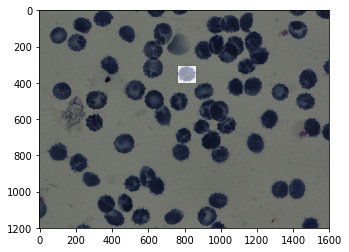

In [22]:
print(img.shape)
print(masks.shape)
# plot image
plt.imshow(img)
# plot mask
plt.imshow(masks[:, :, 3], cmap='gray', alpha=0.5)
#plt.show()

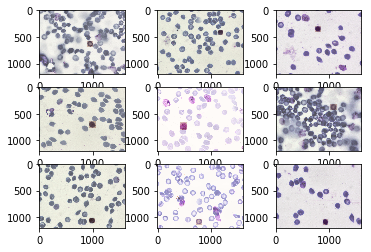

In [23]:
# plot first few images
for i in range(9):
    # define subplot
    plt.subplot(330+1+i)
    
    
    # plot raw pixel data
    image = load_image(dataset['path'][i])
    plt.imshow(image)
    # plot all masks
    mask, _ = load_mask(dataset['path'][i])
    
   # for j in range(mask.shape[2]):
    plt.imshow(mask[:, :, 2], cmap='Oranges', alpha=0.3)
    
# show the figure
plt.show()

In [24]:
image.shape[:2]

(1200, 1600)

(1200, 1600)
(1200, 1600, 49)


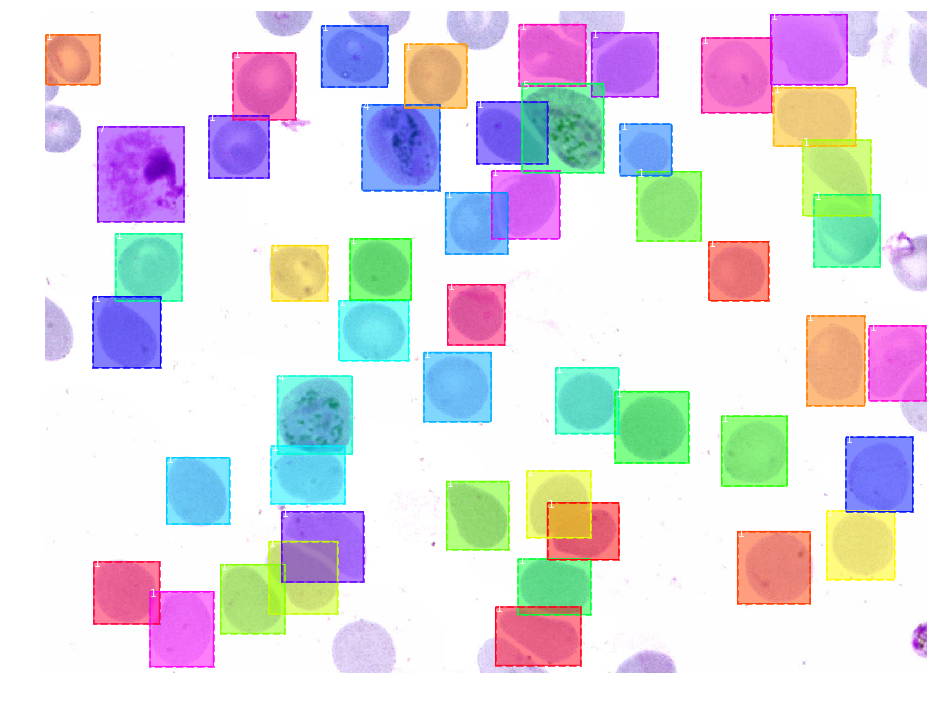

In [25]:
# display mask , bounding box of all objects of a image
image_id = dataset['path'][4]
# load the image
image = load_image(image_id)
print(image.shape[:2])
# load the masks and the class ids
mask, class_ids = load_mask(image_id)
print(mask.shape)
# extract bounding boxes from the masks
bbox = extract_bboxes(mask)
#print(class_ids)
# display image with masks and bounding boxes
display_instances(image, bbox, mask, class_ids, cat_dict)

# 5. Prepare dataset with bounding box information

In [26]:
class MalariaDataset(Dataset):
    # load the dataset definitions
    def load_dataset(self, dataset_dir, is_train):
        """ Load the train/test dataset.
        dataset_dir: directory of image
        is_train: if true load train dataset else test dataset
        """
        if (is_train):
            print("Loading Train dataset" )
        else:
            print("Loading Test dataset" )
        # define classes
        self.add_class('dataset', 1, "red blood cell")
        self.add_class('dataset', 2, "trophozoite")
        self.add_class('dataset', 3, "difficult")
        self.add_class('dataset', 4, "ring")
        self.add_class('dataset', 5, "schizont")
        self.add_class('dataset', 6, "gametocyte")
        self.add_class('dataset', 7, "leukocyte")
        
        # define data locations
        images_dir = dataset_dir + '/images/'
        
        
        length=len(listdir(images_dir))
        # find all images
        for filename in listdir(images_dir):
                     
            # extract image id
            image_id = dataset.image_id[dataset['image_name']==filename].values
             
            # skip all images after 1207 if we are building the train set
            if is_train and image_id >= 1208:
                continue
            # skip all images before 1207 if we are building the test/val set
            if not is_train and image_id < 1208:
                continue
            img_path = images_dir + filename
            #ann_path = annotations_dir + image_id + '.xml'
            # add to dataset
           # print(image_id, img_path)
            self.add_image( 'dataset', image_id=image_id, path=img_path)
        
    def load_image(self, image_id):
        """Load the specified image and return a [H,W,3] Numpy array.
        """
        #print("Loading image: ", image_id)
        # Load image
        for info in self.image_info:
            if info["id"] == image_id or info["id"] == image_id+1208:
                #print("Loading image: ",info["id"], " ",info['path'])
                img = skimage.io.imread(info['path'])
        
        
       # image = skimage.io.imread(self.image_info[image_id]['path'])
        # If grayscale. Convert to RGB for consistency.
        if img.ndim != 3:
            img = skimage.color.gray2rgb(img)
        # If has an alpha channel, remove it for consistency
        if img.shape[-1] == 4:
            img = img[..., :3]
        return img

    
    def extract_boxes(self,image_id):
        """Function to extract bounding boxes from training/test json file
    
        Returns: 
            List of boxes, array of class_id of boxes, width and height of image
        """
    
        boxes = list()
        class_id = list()
        for info in self.image_info:
            if info["id"] == image_id or info["id"] == image_id+1208:
                #print("Extracting image: ",info["id"], " ",info['path'])
                img = skimage.io.imread(info['path'])                
                image_id=info["id"]
                image_id=image_id[0]
                
        
        df=[]
        df=(object_df.loc[object_df['image_id'] == image_id])
        #print("df: ",df)

        for  i,bbox in df.iterrows():
            coors = [bbox['c_min'], bbox['r_min'], bbox['c_max'], bbox['r_max']]
            boxes.append(coors)
            class_id.append(cat_dict[bbox['category']])
        # extract image dimensions
        width = img.shape[1]
        height = img.shape[0]
        return boxes, class_id,width, height


    # load the masks for an image
    def load_mask(self,image_id):
        """Load instance masks for the given image.

        Returns:
            masks: A bool array of shape [height, width, instance count] with
                a binary mask per instance.
            class_ids: a 1D array of class IDs of the instance masks.
        """  
        boxes, class_ids, w, h = self.extract_boxes(image_id)
        
        #print(class_ids)
        # create one array for all masks, each on a different channel
        masks = np.zeros([h, w, len(boxes)], dtype='uint8')
    
        # create masks
        
        for i in range(len(boxes)):
            box = boxes[i]
            row_s, row_e = box[1], box[3]
            col_s, col_e = box[0], box[2]
            masks[row_s:row_e, col_s:col_e, i] = 1
            
        return masks, np.asarray(class_ids)
 
        
    # load an image reference
    def image_reference(self, image_id):
        """Return image info i.e path of that image
        """
        info = self.image_info[image_id]
        return info['path']


In [27]:
# prepare train set
train_set = MalariaDataset()
train_set.load_dataset(malaria_dir, is_train=True)
train_set.prepare()

test_set = MalariaDataset()
test_set.load_dataset(malaria_dir, is_train=False)
test_set.prepare()
#[12] 065af549-320a-4862-b92a-8ef750d7b5fb.png

Loading Train dataset
Loading Test dataset


[1 1 1 1 1 1 1 1 1 1 1 1 1 1 3 1 1 1 1 1 1 1 1 1 6 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]


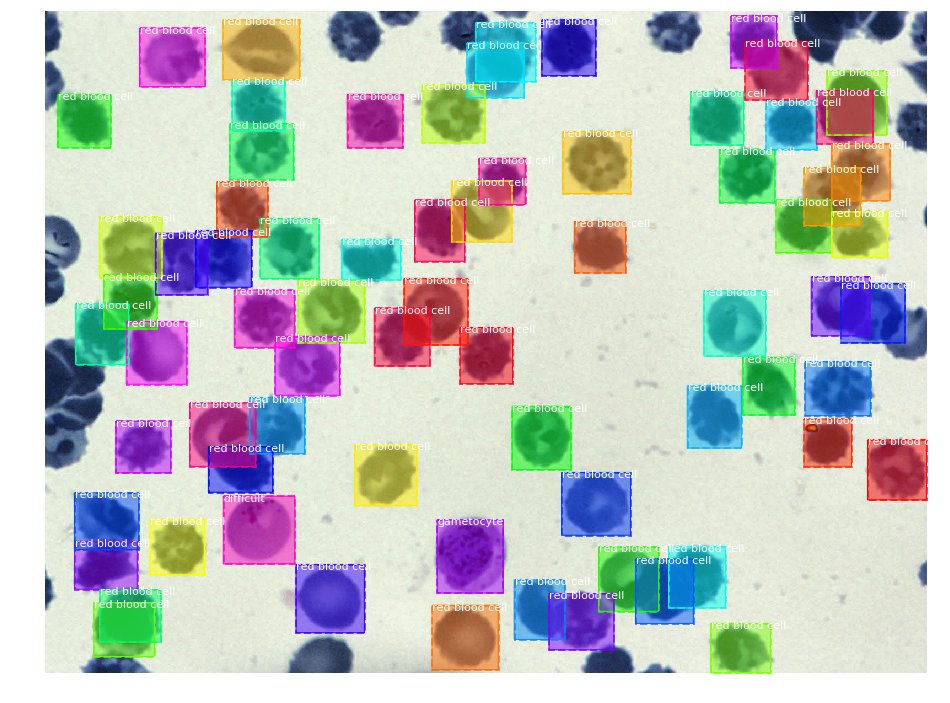

In [28]:
# Test code to check if image loading, masking and boxing works properly on not
# load an image
image_id = 15
image = train_set.load_image(image_id)
#plt.imshow(image)
#print(image.shape)
# load image mask
mask, class_ids = train_set.load_mask(image_id)
#print(mask.shape)
#plt.imshow(image)
#plt.title('Actual')
# plot masks
#print(mask.shape[2])
#for j in range(mask.shape[2]):
#plt.imshow(mask[:, :, 5], cmap='gray', alpha=0.3)
print(class_ids)
bbox = extract_bboxes(mask)
# display image with masks and bounding boxes

display_instances(image, bbox, mask, class_ids,  dict,show_mask=True,show_bbox=True)

molded_image             shape: (512, 512, 3)         min:    0.00000  max:  249.00000  uint8
mask                     shape: (512, 512, 71)        min:    0.00000  max:    1.00000  uint8


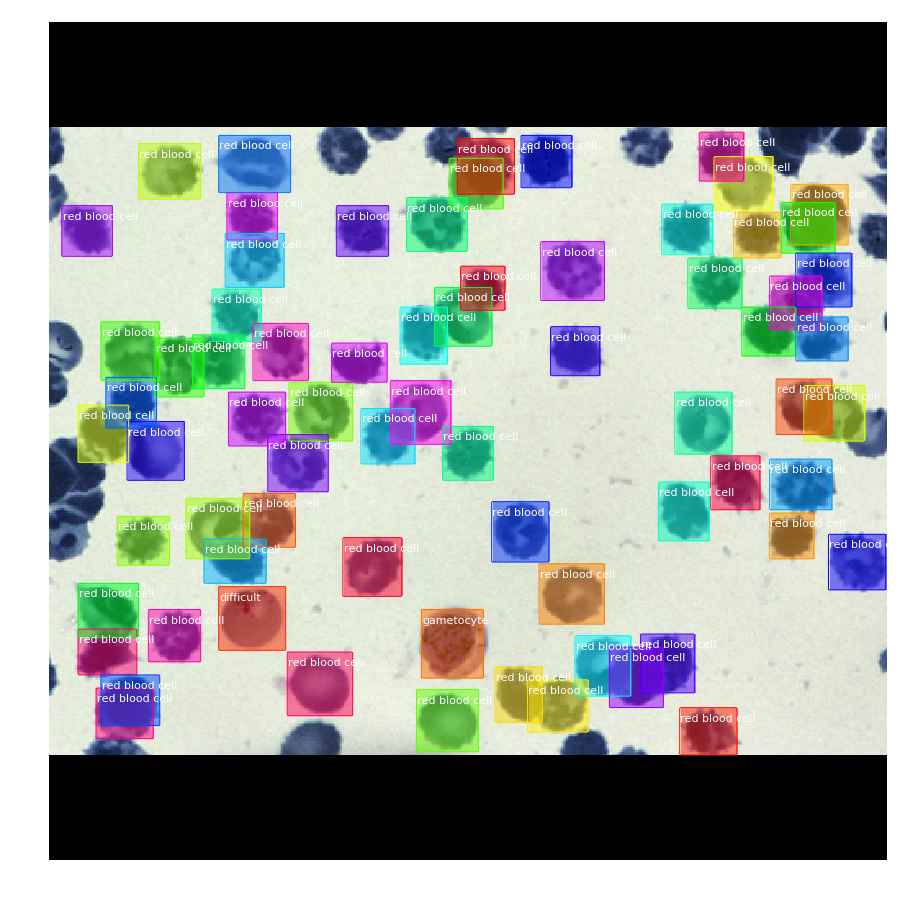

In [40]:
import mrcnn.model as modellib
from mrcnn.model import log
# Load and display using mrcnn model which is interally called all functions
image, image_meta, class_ids, bbox, mask = modellib.load_image_gt(
        train_set, config, image_id=15, use_mini_mask=False)
log("molded_image", image)
log("mask", mask)
display_instances(image, bbox, mask, class_ids, train_set.class_names,
                            show_bbox=False,show_mask=True)

In [ ]:
print('Train: %d' % len(train_set.image_ids))
print('Test: %d' % len(test_set.image_ids))

In [ ]:
# enumerate all images in the dataset
for image_id in train_set.image_ids:
	# load image info
	info = train_set.image_info[image_id]
	# display on the console
print(info)

# 6. Define configuration for model training

In [39]:
class MalariaConfig(Config):

    # Setting other parameters...

    def __init__(self, num_classes):
        self.NAME = "malaria_cfg"
        self.NUM_CLASSES = num_classes
        self.STEPS_PER_EPOCH =500
        self.IMAGE_MAX_DIM=512
        self.IMAGE_MIN_DIM=512
        
        
        super().__init__()
        
config = MalariaConfig(num_classes=8)
config.NUM_CLASSES
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     2
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.7
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 2
IMAGE_MAX_DIM                  512
IMAGE_META_SIZE                20
IMAGE_MIN_DIM                  512
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [512 512   3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE                     [28, 28]
MAX_GT_INSTANCES

In [ ]:

gpu_options = tf.GPUOptions(allow_growth=True)
session = tf.InteractiveSession(config=tf.ConfigProto(gpu_options=gpu_options))

# 7. Train the model


To train the model using predefined weights.The first step is to download the model file (architecture and weights) for the pre-fit Mask R-CNN model.
Download the model weights to a file with the name ‘mask_rcnn_coco.h5‘ from matterplot github directory of Mask R-CNN, in your current working directory.
Load weight mask_rcnn_coco.h5 which we have downloaded.

Then, define the model by creating an instance of the mrcnn.model.MaskRCNN class and specifying the model will be used for training via setting the ‘mode‘ argument to ‘training‘ and use config which we define above.

In [48]:
import warnings
warnings.filterwarnings("ignore")

# define the model
model = MaskRCNN(mode='training', model_dir='./', config=config)
# load weights (mscoco) and exclude the output layers
model.load_weights('mask_rcnn_coco.h5', by_name=True, exclude=["mrcnn_class_logits", "mrcnn_bbox_fc",  "mrcnn_bbox", "mrcnn_mask"])
# train weights (output layers or 'heads')
model.train(train_set, test_set, learning_rate=config.LEARNING_RATE, epochs=5, layers='heads')

W1118 22:52:05.173838 20592 deprecation_wrapper.py:119] From C:\Users\mukesh\Anaconda3\lib\site-packages\keras\backend\tensorflow_backend.py:517: The name tf.placeholder is deprecated. Please use tf.compat.v1.placeholder instead.

W1118 22:52:05.186829 20592 deprecation_wrapper.py:119] From C:\Users\mukesh\Anaconda3\lib\site-packages\keras\backend\tensorflow_backend.py:74: The name tf.get_default_graph is deprecated. Please use tf.compat.v1.get_default_graph instead.

W1118 22:52:05.216749 20592 deprecation_wrapper.py:119] From C:\Users\mukesh\Anaconda3\lib\site-packages\keras\backend\tensorflow_backend.py:4138: The name tf.random_uniform is deprecated. Please use tf.random.uniform instead.

W1118 22:52:05.247642 20592 deprecation_wrapper.py:119] From C:\Users\mukesh\Anaconda3\lib\site-packages\keras\backend\tensorflow_backend.py:1919: The name tf.nn.fused_batch_norm is deprecated. Please use tf.compat.v1.nn.fused_batch_norm instead.

W1118 22:52:05.251631 20592 deprecation_wrapper.py:


Starting at epoch 0. LR=0.001

Checkpoint Path: ./malaria_cfg20191118T2252\mask_rcnn_malaria_cfg_{epoch:04d}.h5
Selecting layers to train
fpn_c5p5               (Conv2D)
fpn_c4p4               (Conv2D)
fpn_c3p3               (Conv2D)
fpn_c2p2               (Conv2D)
fpn_p5                 (Conv2D)
fpn_p2                 (Conv2D)
fpn_p3                 (Conv2D)
fpn_p4                 (Conv2D)
In model:  rpn_model
    rpn_conv_shared        (Conv2D)
    rpn_class_raw          (Conv2D)
    rpn_bbox_pred          (Conv2D)
mrcnn_mask_conv1       (TimeDistributed)
mrcnn_mask_bn1         (TimeDistributed)
mrcnn_mask_conv2       (TimeDistributed)
mrcnn_mask_bn2         (TimeDistributed)
mrcnn_class_conv1      (TimeDistributed)
mrcnn_class_bn1        (TimeDistributed)
mrcnn_mask_conv3       (TimeDistributed)
mrcnn_mask_bn3         (TimeDistributed)
mrcnn_class_conv2      (TimeDistributed)
mrcnn_class_bn2        (TimeDistributed)
mrcnn_mask_conv4       (TimeDistributed)
mrcnn_mask_bn4         (T

W1118 22:52:14.567490 20592 deprecation_wrapper.py:119] From C:\Users\mukesh\Anaconda3\lib\site-packages\keras\optimizers.py:790: The name tf.train.Optimizer is deprecated. Please use tf.compat.v1.train.Optimizer instead.

W1118 22:52:18.155642 20592 deprecation_wrapper.py:119] From C:\Users\mukesh\Anaconda3\lib\site-packages\keras\callbacks.py:850: The name tf.summary.merge_all is deprecated. Please use tf.compat.v1.summary.merge_all instead.

W1118 22:52:18.156651 20592 deprecation_wrapper.py:119] From C:\Users\mukesh\Anaconda3\lib\site-packages\keras\callbacks.py:853: The name tf.summary.FileWriter is deprecated. Please use tf.compat.v1.summary.FileWriter instead.



Epoch 1/5
Loading image:  [291]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/5487faad-24a7-46b6-92d8-479d3a8d229f.png
Loading image:  [613]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/697bdbc0-6e31-4e48-ac74-ba4ab5760d32.png
  1/500 [..............................] - ETA: 1:05:00 - loss: 9.7153 - rpn_class_loss: 0.9764 - rpn_bbox_loss: 0.1599 - mrcnn_class_loss: 6.0732 - mrcnn_bbox_loss: 1.5790 - mrcnn_mask_loss: 0.9269Loading image:  [344]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/787abd97-dd37-4212-8b43-61696eb3abc0.png
Loading image:  [154]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/3859deaf-6ae1-49a3-9051-898d0f0d7de6.png
  2/500 [..............................] - E

 29/500 [>.............................] - ETA: 34:38 - loss: 3.0421 - rpn_class_loss: 0.2702 - rpn_bbox_loss: 0.1522 - mrcnn_class_loss: 1.2840 - mrcnn_bbox_loss: 0.7156 - mrcnn_mask_loss: 0.6201Loading image:  [52]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/25132962-ff5d-4737-995f-c54d8490539b.png
Loading image:  [243]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/c7c1b873-0548-4a73-9618-f60912e164df.png
 30/500 [>.............................] - ETA: 35:23 - loss: 2.9890 - rpn_class_loss: 0.2632 - rpn_bbox_loss: 0.1516 - mrcnn_class_loss: 1.2593 - mrcnn_bbox_loss: 0.7014 - mrcnn_mask_loss: 0.6135Loading image:  [1151]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/90a82250-1f68-48c9-9af9-15f18bf8c974.png
Loading image:  [218]   C:/Users/mukesh/Desktop

 57/500 [==>...........................] - ETA: 33:30 - loss: 2.0994 - rpn_class_loss: 0.1576 - rpn_bbox_loss: 0.1272 - mrcnn_class_loss: 0.8529 - mrcnn_bbox_loss: 0.4793 - mrcnn_mask_loss: 0.4824Loading image:  [153]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/53afd70c-08a7-4b9a-b137-7003b2ecbeab.png
Loading image:  [625]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/8a4aadac-cf5c-4a79-b875-271b3fbfd230.png
 58/500 [==>...........................] - ETA: 33:18 - loss: 2.0778 - rpn_class_loss: 0.1551 - rpn_bbox_loss: 0.1262 - mrcnn_class_loss: 0.8442 - mrcnn_bbox_loss: 0.4734 - mrcnn_mask_loss: 0.4787Loading image:  [228]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/1fdf99d1-a494-4174-bcd7-efbe457ab899.png
Loading image:  [611]   C:/Users/mukesh/Desktop

 85/500 [====>.........................] - ETA: 30:58 - loss: 1.7278 - rpn_class_loss: 0.1132 - rpn_bbox_loss: 0.1167 - mrcnn_class_loss: 0.7003 - mrcnn_bbox_loss: 0.3806 - mrcnn_mask_loss: 0.4170Loading image:  [133]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/e234ce8b-4ec4-4d93-9068-d7854d77ddf4.png
Loading image:  [1154]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/34df8890-272d-423a-ae78-ff8d068d3306.png
 86/500 [====>.........................] - ETA: 30:57 - loss: 1.7185 - rpn_class_loss: 0.1123 - rpn_bbox_loss: 0.1163 - mrcnn_class_loss: 0.6971 - mrcnn_bbox_loss: 0.3778 - mrcnn_mask_loss: 0.4150Loading image:  [335]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/9b3fd401-dab0-440f-8498-eb3cc9ffa970.png
Loading image:  [563]   C:/Users/mukesh/Deskto

113/500 [=====>........................] - ETA: 28:16 - loss: 1.5081 - rpn_class_loss: 0.0913 - rpn_bbox_loss: 0.1097 - mrcnn_class_loss: 0.6124 - mrcnn_bbox_loss: 0.3214 - mrcnn_mask_loss: 0.3734Loading image:  [169]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/1380f9b4-bf54-4492-90c3-743c7aa8898b.png
Loading image:  [765]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/f2574be3-81c6-4fc3-8a40-0230d1264f52.png
114/500 [=====>........................] - ETA: 28:12 - loss: 1.5038 - rpn_class_loss: 0.0906 - rpn_bbox_loss: 0.1096 - mrcnn_class_loss: 0.6109 - mrcnn_bbox_loss: 0.3203 - mrcnn_mask_loss: 0.3723Loading image:  [159]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/09ecf7be-28e2-4531-b9e2-07e01c44097d.png
Loading image:  [131]   C:/Users/mukesh/Desktop

141/500 [=======>......................] - ETA: 26:12 - loss: 1.3657 - rpn_class_loss: 0.0768 - rpn_bbox_loss: 0.1043 - mrcnn_class_loss: 0.5546 - mrcnn_bbox_loss: 0.2856 - mrcnn_mask_loss: 0.3445Loading image:  [148]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/e3a4b3e7-9500-4b6c-a402-b6d3f45e714b.png
Loading image:  [37]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/a2ccbf70-e444-49a9-8b7e-9797a05220d8.png
142/500 [=======>......................] - ETA: 26:08 - loss: 1.3617 - rpn_class_loss: 0.0765 - rpn_bbox_loss: 0.1040 - mrcnn_class_loss: 0.5529 - mrcnn_bbox_loss: 0.2847 - mrcnn_mask_loss: 0.3436Loading image:  [993]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/dec61ae1-5037-4c3a-8952-15371becca7d.png
Loading image:  [306]   C:/Users/mukesh/Desktop/

169/500 [=========>....................] - ETA: 24:11 - loss: 1.2860 - rpn_class_loss: 0.0681 - rpn_bbox_loss: 0.1026 - mrcnn_class_loss: 0.5266 - mrcnn_bbox_loss: 0.2622 - mrcnn_mask_loss: 0.3264Loading image:  [328]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/5077f87d-a19f-494c-b911-14ccb03bd230.png
Loading image:  [727]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/9e0e1928-d19a-4100-b093-0b962ac09e05.png
170/500 [=========>....................] - ETA: 24:08 - loss: 1.2835 - rpn_class_loss: 0.0680 - rpn_bbox_loss: 0.1026 - mrcnn_class_loss: 0.5255 - mrcnn_bbox_loss: 0.2614 - mrcnn_mask_loss: 0.3260Loading image:  [601]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/f8b14fc4-dd6b-4ad0-a96d-c62845f48681.png
Loading image:  [1191]   C:/Users/mukesh/Deskto

197/500 [==========>...................] - ETA: 21:57 - loss: 1.2175 - rpn_class_loss: 0.0615 - rpn_bbox_loss: 0.1004 - mrcnn_class_loss: 0.5016 - mrcnn_bbox_loss: 0.2425 - mrcnn_mask_loss: 0.3115Loading image:  [852]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/43072c64-4c08-47cd-ae8a-b74d31f80008.png
Loading image:  [615]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/17ef5841-bd19-4610-ba47-7d321231847b.png
198/500 [==========>...................] - ETA: 21:54 - loss: 1.2139 - rpn_class_loss: 0.0613 - rpn_bbox_loss: 0.1002 - mrcnn_class_loss: 0.5002 - mrcnn_bbox_loss: 0.2416 - mrcnn_mask_loss: 0.3108Loading image:  [378]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/bb3ae957-0f6d-4615-bfe5-24fbca50b459.png
Loading image:  [889]   C:/Users/mukesh/Desktop

225/500 [============>.................] - ETA: 20:03 - loss: 1.1652 - rpn_class_loss: 0.0570 - rpn_bbox_loss: 0.0985 - mrcnn_class_loss: 0.4815 - mrcnn_bbox_loss: 0.2283 - mrcnn_mask_loss: 0.2999Loading image:  [957]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/a72cd558-b7ac-4bf2-a344-2ce6c73a354e.png
Loading image:  [588]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/003a89b0-a095-417a-8dd6-f408339bbc68.png
226/500 [============>.................] - ETA: 19:58 - loss: 1.1627 - rpn_class_loss: 0.0568 - rpn_bbox_loss: 0.0983 - mrcnn_class_loss: 0.4804 - mrcnn_bbox_loss: 0.2277 - mrcnn_mask_loss: 0.2995Loading image:  [859]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/177a3141-fa93-426a-9b52-7da71547ce44.png
Loading image:  [244]   C:/Users/mukesh/Desktop

253/500 [==============>...............] - ETA: 18:06 - loss: 1.1256 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.0968 - mrcnn_class_loss: 0.4682 - mrcnn_bbox_loss: 0.2173 - mrcnn_mask_loss: 0.2909Loading image:  [102]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/f4a27dfd-4c52-459f-96b5-ee6b452a3395.png
Loading image:  [919]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/acb16781-11ad-4327-874a-5c9c35dcb085.png
254/500 [==============>...............] - ETA: 18:00 - loss: 1.1242 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 0.0967 - mrcnn_class_loss: 0.4678 - mrcnn_bbox_loss: 0.2169 - mrcnn_mask_loss: 0.2906Loading image:  [468]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/81c3c8f0-d5a9-4dda-afd5-e86f6afd9424.png
Loading image:  [576]   C:/Users/mukesh/Desktop

281/500 [===============>..............] - ETA: 16:08 - loss: 1.0946 - rpn_class_loss: 0.0491 - rpn_bbox_loss: 0.0957 - mrcnn_class_loss: 0.4566 - mrcnn_bbox_loss: 0.2094 - mrcnn_mask_loss: 0.2837Loading image:  [289]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/b4d22412-a495-43a9-bec0-73a2322f8dad.png
Loading image:  [826]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/7bcd3735-3134-46d1-8ca2-d4379f2d51c0.png
282/500 [===============>..............] - ETA: 16:05 - loss: 1.0944 - rpn_class_loss: 0.0492 - rpn_bbox_loss: 0.0958 - mrcnn_class_loss: 0.4568 - mrcnn_bbox_loss: 0.2091 - mrcnn_mask_loss: 0.2836Loading image:  [616]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/fbcb2ef0-3c97-4d7a-8b96-0147c73f3941.png
Loading image:  [988]   C:/Users/mukesh/Desktop

309/500 [=================>............] - ETA: 14:08 - loss: 1.0653 - rpn_class_loss: 0.0463 - rpn_bbox_loss: 0.0947 - mrcnn_class_loss: 0.4440 - mrcnn_bbox_loss: 0.2022 - mrcnn_mask_loss: 0.2781Loading image:  [803]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/94d9fa50-d3e4-4eaf-acfc-92e7f2ed9ea5.png
Loading image:  [311]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/9d819c89-4ea9-4e75-9b03-da87fa6c6f4d.png
310/500 [=================>............] - ETA: 14:03 - loss: 1.0633 - rpn_class_loss: 0.0462 - rpn_bbox_loss: 0.0945 - mrcnn_class_loss: 0.4430 - mrcnn_bbox_loss: 0.2018 - mrcnn_mask_loss: 0.2777Loading image:  [1002]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/397f37bc-a3a4-4257-9430-c8fc5716f8b1.png
Loading image:  [892]   C:/Users/mukesh/Deskto

337/500 [===================>..........] - ETA: 11:59 - loss: 1.0345 - rpn_class_loss: 0.0436 - rpn_bbox_loss: 0.0930 - mrcnn_class_loss: 0.4316 - mrcnn_bbox_loss: 0.1945 - mrcnn_mask_loss: 0.2717Loading image:  [165]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/20d4f65e-6c63-433a-935c-d568d577967b.png
Loading image:  [488]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/6695a204-e39c-4418-b904-3f080fdbe7e8.png
338/500 [===================>..........] - ETA: 11:57 - loss: 1.0359 - rpn_class_loss: 0.0436 - rpn_bbox_loss: 0.0932 - mrcnn_class_loss: 0.4324 - mrcnn_bbox_loss: 0.1947 - mrcnn_mask_loss: 0.2720Loading image:  [741]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/afbb264e-ff60-443a-83f5-49d09be1b835.png
Loading image:  [914]   C:/Users/mukesh/Desktop

365/500 [====================>.........] - ETA: 9:56 - loss: 1.0170 - rpn_class_loss: 0.0418 - rpn_bbox_loss: 0.0927 - mrcnn_class_loss: 0.4251 - mrcnn_bbox_loss: 0.1895 - mrcnn_mask_loss: 0.2680 Loading image:  [496]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/f62d4fb6-df7c-446c-94a8-d5aede0b1e0c.png
Loading image:  [1099]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/01b99da8-b66b-464b-a7ee-1cadab8db18b.png
366/500 [====================>.........] - ETA: 9:52 - loss: 1.0165 - rpn_class_loss: 0.0418 - rpn_bbox_loss: 0.0927 - mrcnn_class_loss: 0.4249 - mrcnn_bbox_loss: 0.1893 - mrcnn_mask_loss: 0.2678Loading image:  [164]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/9fbf38ab-44b9-4096-a818-603017a4300e.png
Loading image:  [1067]   C:/Users/mukesh/Deskto

393/500 [======================>.......] - ETA: 7:51 - loss: 0.9916 - rpn_class_loss: 0.0400 - rpn_bbox_loss: 0.0911 - mrcnn_class_loss: 0.4147 - mrcnn_bbox_loss: 0.1832 - mrcnn_mask_loss: 0.2627Loading image:  [539]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/fa1f9f89-cecb-4972-842c-d14c632f89a9.png
Loading image:  [430]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/f5869ba8-6253-426b-93f3-82af59a86144.png
394/500 [======================>.......] - ETA: 7:47 - loss: 0.9910 - rpn_class_loss: 0.0399 - rpn_bbox_loss: 0.0910 - mrcnn_class_loss: 0.4144 - mrcnn_bbox_loss: 0.1831 - mrcnn_mask_loss: 0.2626Loading image:  [1063]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/9edba799-e169-46cd-b100-c9f8fc7a8c7d.png
Loading image:  [606]   C:/Users/mukesh/Desktop/

421/500 [========================>.....] - ETA: 5:47 - loss: 0.9754 - rpn_class_loss: 0.0385 - rpn_bbox_loss: 0.0903 - mrcnn_class_loss: 0.4089 - mrcnn_bbox_loss: 0.1785 - mrcnn_mask_loss: 0.2593Loading image:  [1047]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/77e76e62-2c71-4b52-9b21-0d1bcde9f9bf.png
Loading image:  [342]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/ca677c3c-083f-4d54-9dec-39f79f6a17d8.png
422/500 [========================>.....] - ETA: 5:42 - loss: 0.9746 - rpn_class_loss: 0.0384 - rpn_bbox_loss: 0.0902 - mrcnn_class_loss: 0.4084 - mrcnn_bbox_loss: 0.1783 - mrcnn_mask_loss: 0.2592Loading image:  [72]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/a2d07312-2f97-40d2-8b09-7f2aca7b16fb.png
Loading image:  [352]   C:/Users/mukesh/Desktop/A

449/500 [=========================>....] - ETA: 3:44 - loss: 0.9596 - rpn_class_loss: 0.0369 - rpn_bbox_loss: 0.0894 - mrcnn_class_loss: 0.4030 - mrcnn_bbox_loss: 0.1742 - mrcnn_mask_loss: 0.2562Loading image:  [723]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/edd09b2e-2673-4405-8ac0-e476e003e96a.png
Loading image:  [994]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/ff3b9d4d-373c-48ef-a75a-d23e2c2ade87.png
450/500 [==========================>...] - ETA: 3:39 - loss: 0.9591 - rpn_class_loss: 0.0368 - rpn_bbox_loss: 0.0894 - mrcnn_class_loss: 0.4028 - mrcnn_bbox_loss: 0.1740 - mrcnn_mask_loss: 0.2560Loading image:  [1018]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/9106a6bb-1352-411f-ac26-0d6fe48c16a8.png
Loading image:  [432]   C:/Users/mukesh/Desktop/

477/500 [===========================>..] - ETA: 1:41 - loss: 0.9428 - rpn_class_loss: 0.0355 - rpn_bbox_loss: 0.0885 - mrcnn_class_loss: 0.3957 - mrcnn_bbox_loss: 0.1703 - mrcnn_mask_loss: 0.2529Loading image:  [893]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/7942691b-6376-4c75-ae8a-ddf65454dcb2.png
Loading image:  [856]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/1893e0c5-88e9-4644-bd59-3e47bc53a88c.png
478/500 [===========================>..] - ETA: 1:36 - loss: 0.9419 - rpn_class_loss: 0.0355 - rpn_bbox_loss: 0.0884 - mrcnn_class_loss: 0.3952 - mrcnn_bbox_loss: 0.1701 - mrcnn_mask_loss: 0.2527Loading image:  [538]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/b4bde4e8-f48b-4ae2-be01-86d8c91d0af9.png
Loading image:  [332]   C:/Users/mukesh/Desktop/A

Loading image:  [1317]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/b47c1011-0cc6-400d-9300-1c72f873a6e5.jpg
Loading image:  [1272]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/224c80b8-6c55-48cf-b719-96a47d223dc3.jpg
Loading image:  [1271]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/34950f4e-fe44-49ec-9d49-14bd4a8ce7c0.jpg
Loading image:  [1273]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/51a42643-256f-463a-bf22-7fd295caead0.jpg
Loading image:  [1265]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/a1265844-329c-4a49-a37f-e0541b83a50c.jpg
Loading image:  [1281]   C:/Users/mukesh/Desktop/Applied AI/

Loading image:  [517]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/877d5e7f-19b6-40e7-81bd-c92f25e72503.png
Loading image:  [385]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/530761d4-1931-44cd-b220-d60db0e228f9.png
  1/500 [..............................] - ETA: 22:27 - loss: 0.6024 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.0789 - mrcnn_class_loss: 0.2175 - mrcnn_bbox_loss: 0.1103 - mrcnn_mask_loss: 0.1886Loading image:  [142]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/04628a94-b674-469b-aff6-b476b70df87d.png
Loading image:  [486]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/31c749e8-18d1-4105-b7e6-8319cceddae0.png
  2/500 [..............................] - ETA: 23:36 - 

 29/500 [>.............................] - ETA: 34:06 - loss: 0.7018 - rpn_class_loss: 0.0142 - rpn_bbox_loss: 0.0818 - mrcnn_class_loss: 0.2897 - mrcnn_bbox_loss: 0.1104 - mrcnn_mask_loss: 0.2057Loading image:  [779]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/79f2fbab-169d-4062-820d-3dfd12f062c8.png
Loading image:  [360]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/be5bb7d0-7c3f-4bb9-8bb4-f8bc8d875943.png
 30/500 [>.............................] - ETA: 33:47 - loss: 0.7055 - rpn_class_loss: 0.0146 - rpn_bbox_loss: 0.0823 - mrcnn_class_loss: 0.2919 - mrcnn_bbox_loss: 0.1110 - mrcnn_mask_loss: 0.2057Loading image:  [242]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/64113b22-03b1-4ab8-89ab-b2f32154fbbd.png
Loading image:  [1175]   C:/Users/mukesh/Deskto

 57/500 [==>...........................] - ETA: 33:01 - loss: 0.7276 - rpn_class_loss: 0.0138 - rpn_bbox_loss: 0.0815 - mrcnn_class_loss: 0.3075 - mrcnn_bbox_loss: 0.1139 - mrcnn_mask_loss: 0.2109Loading image:  [300]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/b318889c-3c60-477c-b8f6-d18cb01a59df.png
Loading image:  [273]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/1863da5f-c595-4541-a8f4-21fe78678168.png
 58/500 [==>...........................] - ETA: 33:08 - loss: 0.7303 - rpn_class_loss: 0.0139 - rpn_bbox_loss: 0.0817 - mrcnn_class_loss: 0.3087 - mrcnn_bbox_loss: 0.1148 - mrcnn_mask_loss: 0.2113Loading image:  [763]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/99b13257-b9d9-422f-8262-802da0bdc510.png
Loading image:  [109]   C:/Users/mukesh/Desktop

 85/500 [====>.........................] - ETA: 30:03 - loss: 0.7105 - rpn_class_loss: 0.0133 - rpn_bbox_loss: 0.0772 - mrcnn_class_loss: 0.3052 - mrcnn_bbox_loss: 0.1086 - mrcnn_mask_loss: 0.2061Loading image:  [8]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/c6d97845-8ad2-4ab7-b385-66613628df5b.png
Loading image:  [579]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/b2e34f5f-904e-4473-9dc7-c6bc1ce12640.png
 86/500 [====>.........................] - ETA: 30:21 - loss: 0.7178 - rpn_class_loss: 0.0135 - rpn_bbox_loss: 0.0783 - mrcnn_class_loss: 0.3088 - mrcnn_bbox_loss: 0.1098 - mrcnn_mask_loss: 0.2074Loading image:  [222]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/3b13e20f-ec0d-44ec-b2f4-eaebfa09150e.png
Loading image:  [393]   C:/Users/mukesh/Desktop/A

113/500 [=====>........................] - ETA: 28:27 - loss: 0.6989 - rpn_class_loss: 0.0129 - rpn_bbox_loss: 0.0759 - mrcnn_class_loss: 0.2989 - mrcnn_bbox_loss: 0.1063 - mrcnn_mask_loss: 0.2049Loading image:  [671]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/6c7095cd-ab6b-4f53-bd94-905d0cc95840.png
Loading image:  [84]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/06df7bbe-60d4-4f7c-ba4a-5a42ac4be91b.png
114/500 [=====>........................] - ETA: 28:21 - loss: 0.6967 - rpn_class_loss: 0.0128 - rpn_bbox_loss: 0.0758 - mrcnn_class_loss: 0.2978 - mrcnn_bbox_loss: 0.1059 - mrcnn_mask_loss: 0.2045Loading image:  [696]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/8002cb71-0f25-4fa4-a46f-b49e5aeded0c.png
Loading image:  [297]   C:/Users/mukesh/Desktop/

141/500 [=======>......................] - ETA: 26:09 - loss: 0.6922 - rpn_class_loss: 0.0126 - rpn_bbox_loss: 0.0750 - mrcnn_class_loss: 0.2937 - mrcnn_bbox_loss: 0.1055 - mrcnn_mask_loss: 0.2054Loading image:  [399]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/412c9fa5-fcf4-402b-b1e4-3271f775058e.png
Loading image:  [664]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/b8dd6125-5027-47e2-a283-14e199274c80.png
142/500 [=======>......................] - ETA: 26:01 - loss: 0.6905 - rpn_class_loss: 0.0125 - rpn_bbox_loss: 0.0749 - mrcnn_class_loss: 0.2928 - mrcnn_bbox_loss: 0.1053 - mrcnn_mask_loss: 0.2050Loading image:  [1150]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/07a96126-482e-4beb-b42a-0cb59e505372.png
Loading image:  [284]   C:/Users/mukesh/Deskto

169/500 [=========>....................] - ETA: 24:20 - loss: 0.6974 - rpn_class_loss: 0.0127 - rpn_bbox_loss: 0.0755 - mrcnn_class_loss: 0.2963 - mrcnn_bbox_loss: 0.1063 - mrcnn_mask_loss: 0.2067Loading image:  [166]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/fac4b0e2-6b52-4c0e-b762-4fa65d552856.png
Loading image:  [1031]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/2b128a1a-95ed-408b-b9f8-8795cc814d80.png
170/500 [=========>....................] - ETA: 24:14 - loss: 0.6964 - rpn_class_loss: 0.0126 - rpn_bbox_loss: 0.0753 - mrcnn_class_loss: 0.2959 - mrcnn_bbox_loss: 0.1060 - mrcnn_mask_loss: 0.2065Loading image:  [378]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/bb3ae957-0f6d-4615-bfe5-24fbca50b459.png
Loading image:  [652]   C:/Users/mukesh/Deskto

197/500 [==========>...................] - ETA: 22:04 - loss: 0.6879 - rpn_class_loss: 0.0124 - rpn_bbox_loss: 0.0739 - mrcnn_class_loss: 0.2935 - mrcnn_bbox_loss: 0.1036 - mrcnn_mask_loss: 0.2046Loading image:  [423]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/71bbdc58-11af-41f2-9a93-3fe9257c5cf3.png
Loading image:  [888]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/d32022fa-e492-4b31-a776-9435cfdef6d6.png
198/500 [==========>...................] - ETA: 22:02 - loss: 0.6871 - rpn_class_loss: 0.0124 - rpn_bbox_loss: 0.0738 - mrcnn_class_loss: 0.2932 - mrcnn_bbox_loss: 0.1034 - mrcnn_mask_loss: 0.2044Loading image:  [194]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/8e4bdd0d-1c72-4836-ae3e-05e2e50e4983.png
Loading image:  [201]   C:/Users/mukesh/Desktop

225/500 [============>.................] - ETA: 19:59 - loss: 0.6838 - rpn_class_loss: 0.0124 - rpn_bbox_loss: 0.0739 - mrcnn_class_loss: 0.2914 - mrcnn_bbox_loss: 0.1026 - mrcnn_mask_loss: 0.2035Loading image:  [682]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/a4851ed0-1499-4eae-9157-dcd34773254f.png
Loading image:  [223]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/458cb2e9-5a7f-437c-ac5d-a56f98a3efdf.png
226/500 [============>.................] - ETA: 19:53 - loss: 0.6830 - rpn_class_loss: 0.0124 - rpn_bbox_loss: 0.0738 - mrcnn_class_loss: 0.2910 - mrcnn_bbox_loss: 0.1024 - mrcnn_mask_loss: 0.2034Loading image:  [138]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/29dc8176-dfe1-40e0-8247-2dc3c530057e.png
Loading image:  [599]   C:/Users/mukesh/Desktop

253/500 [==============>...............] - ETA: 18:10 - loss: 0.6890 - rpn_class_loss: 0.0126 - rpn_bbox_loss: 0.0743 - mrcnn_class_loss: 0.2940 - mrcnn_bbox_loss: 0.1033 - mrcnn_mask_loss: 0.2046Loading image:  [991]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/76021d69-8919-4688-95ef-7418eff620cc.png
Loading image:  [634]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/252071ac-e9f2-41d2-abbb-87ef01b8a997.png
254/500 [==============>...............] - ETA: 18:06 - loss: 0.6910 - rpn_class_loss: 0.0127 - rpn_bbox_loss: 0.0746 - mrcnn_class_loss: 0.2950 - mrcnn_bbox_loss: 0.1036 - mrcnn_mask_loss: 0.2050Loading image:  [11]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/67acd5bc-4658-4c6e-a9b9-cd8ea3a03418.png
Loading image:  [1042]   C:/Users/mukesh/Desktop

281/500 [===============>..............] - ETA: 16:03 - loss: 0.6906 - rpn_class_loss: 0.0123 - rpn_bbox_loss: 0.0744 - mrcnn_class_loss: 0.2957 - mrcnn_bbox_loss: 0.1036 - mrcnn_mask_loss: 0.2047Loading image:  [955]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/f5c51193-8a27-4ef3-83ad-771395d63caf.png
Loading image:  [14]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/dcc1a193-7b74-44f8-ad8d-813751d8fa6b.png
282/500 [===============>..............] - ETA: 15:58 - loss: 0.6904 - rpn_class_loss: 0.0123 - rpn_bbox_loss: 0.0743 - mrcnn_class_loss: 0.2956 - mrcnn_bbox_loss: 0.1036 - mrcnn_mask_loss: 0.2046Loading image:  [690]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/b197093e-2928-46a4-8e35-fa5ea7ea6dac.png
Loading image:  [67]   C:/Users/mukesh/Desktop/A

309/500 [=================>............] - ETA: 13:59 - loss: 0.6879 - rpn_class_loss: 0.0124 - rpn_bbox_loss: 0.0737 - mrcnn_class_loss: 0.2954 - mrcnn_bbox_loss: 0.1028 - mrcnn_mask_loss: 0.2035Loading image:  [719]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/fcc2b245-f47f-447f-8527-275b0005677c.png
Loading image:  [226]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/9d155086-acf5-4c86-a9e1-94b587c46e87.png
310/500 [=================>............] - ETA: 13:54 - loss: 0.6880 - rpn_class_loss: 0.0125 - rpn_bbox_loss: 0.0738 - mrcnn_class_loss: 0.2955 - mrcnn_bbox_loss: 0.1028 - mrcnn_mask_loss: 0.2035Loading image:  [212]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/7d65d296-0f7b-41cc-9073-a547e24326c8.png
Loading image:  [648]   C:/Users/mukesh/Desktop

337/500 [===================>..........] - ETA: 11:57 - loss: 0.6882 - rpn_class_loss: 0.0124 - rpn_bbox_loss: 0.0738 - mrcnn_class_loss: 0.2962 - mrcnn_bbox_loss: 0.1026 - mrcnn_mask_loss: 0.2032Loading image:  [513]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/2a6370b0-08f1-4c11-a639-265d4419c9a3.png
Loading image:  [968]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/f234a2de-f3c8-4521-a306-8cfdf52dd597.png
338/500 [===================>..........] - ETA: 11:52 - loss: 0.6880 - rpn_class_loss: 0.0124 - rpn_bbox_loss: 0.0738 - mrcnn_class_loss: 0.2961 - mrcnn_bbox_loss: 0.1025 - mrcnn_mask_loss: 0.2033Loading image:  [624]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/8271d0d8-9985-43eb-94b3-c702adca139f.png
Loading image:  [113]   C:/Users/mukesh/Desktop

365/500 [====================>.........] - ETA: 9:50 - loss: 0.6855 - rpn_class_loss: 0.0122 - rpn_bbox_loss: 0.0736 - mrcnn_class_loss: 0.2949 - mrcnn_bbox_loss: 0.1020 - mrcnn_mask_loss: 0.2029Loading image:  [270]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/e80bad38-66d0-473e-85dd-92142dba37e6.png
Loading image:  [538]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/b4bde4e8-f48b-4ae2-be01-86d8c91d0af9.png
366/500 [====================>.........] - ETA: 9:45 - loss: 0.6852 - rpn_class_loss: 0.0121 - rpn_bbox_loss: 0.0736 - mrcnn_class_loss: 0.2948 - mrcnn_bbox_loss: 0.1019 - mrcnn_mask_loss: 0.2028Loading image:  [532]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/de5d19b7-e670-4ac7-843b-7ce7bcebdf45.png
Loading image:  [283]   C:/Users/mukesh/Desktop/A

393/500 [======================>.......] - ETA: 7:46 - loss: 0.6858 - rpn_class_loss: 0.0123 - rpn_bbox_loss: 0.0736 - mrcnn_class_loss: 0.2952 - mrcnn_bbox_loss: 0.1018 - mrcnn_mask_loss: 0.2029Loading image:  [1199]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/161978c3-3a05-47a5-9fee-be7d25693eae.png
Loading image:  [895]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/e9916e11-9be6-4dec-9df6-2e7d1a8e1735.png
394/500 [======================>.......] - ETA: 7:42 - loss: 0.6855 - rpn_class_loss: 0.0123 - rpn_bbox_loss: 0.0736 - mrcnn_class_loss: 0.2950 - mrcnn_bbox_loss: 0.1017 - mrcnn_mask_loss: 0.2028Loading image:  [321]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/0403835d-43f4-4a97-abfc-b2ff915f6d7b.png
Loading image:  [44]   C:/Users/mukesh/Desktop/A

421/500 [========================>.....] - ETA: 5:44 - loss: 0.6818 - rpn_class_loss: 0.0121 - rpn_bbox_loss: 0.0731 - mrcnn_class_loss: 0.2934 - mrcnn_bbox_loss: 0.1011 - mrcnn_mask_loss: 0.2022Loading image:  [16]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/c7a2d648-47cb-4b39-afa4-1b7fcfe51934.png
Loading image:  [1128]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/91e93160-eb8d-4de0-b6bc-b98ec33d1663.png
422/500 [========================>.....] - ETA: 5:40 - loss: 0.6814 - rpn_class_loss: 0.0120 - rpn_bbox_loss: 0.0731 - mrcnn_class_loss: 0.2932 - mrcnn_bbox_loss: 0.1010 - mrcnn_mask_loss: 0.2021Loading image:  [929]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/8d5d5c22-2f75-4fe1-9ea3-03a3c7b92ea9.png
Loading image:  [798]   C:/Users/mukesh/Desktop/A

449/500 [=========================>....] - ETA: 3:44 - loss: 0.6845 - rpn_class_loss: 0.0121 - rpn_bbox_loss: 0.0732 - mrcnn_class_loss: 0.2949 - mrcnn_bbox_loss: 0.1015 - mrcnn_mask_loss: 0.2029Loading image:  [1045]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/32700bc7-7a86-49d3-aded-ccaaed4ddc5c.png
Loading image:  [650]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/28bd16ba-2bcf-46af-b889-41b78d2a50c0.png
450/500 [==========================>...] - ETA: 3:39 - loss: 0.6838 - rpn_class_loss: 0.0121 - rpn_bbox_loss: 0.0731 - mrcnn_class_loss: 0.2946 - mrcnn_bbox_loss: 0.1013 - mrcnn_mask_loss: 0.2027Loading image:  [874]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/0dcbf2c9-f959-4703-a72b-f6a81e66c2ea.png
Loading image:  [328]   C:/Users/mukesh/Desktop/

477/500 [===========================>..] - ETA: 1:40 - loss: 0.6790 - rpn_class_loss: 0.0119 - rpn_bbox_loss: 0.0724 - mrcnn_class_loss: 0.2927 - mrcnn_bbox_loss: 0.1004 - mrcnn_mask_loss: 0.2017Loading image:  [550]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/a9159b11-ba49-4885-902e-00c8d5095b98.png
Loading image:  [372]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/c17523c5-90a0-4a6b-9b33-2b4a6cf58d36.png
478/500 [===========================>..] - ETA: 1:36 - loss: 0.6790 - rpn_class_loss: 0.0119 - rpn_bbox_loss: 0.0724 - mrcnn_class_loss: 0.2926 - mrcnn_bbox_loss: 0.1005 - mrcnn_mask_loss: 0.2017Loading image:  [358]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/b687c30d-cf15-445c-b3f6-5aca86584708.png
Loading image:  [509]   C:/Users/mukesh/Desktop/A

Loading image:  [1264]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/51f6463c-1622-4c0d-8482-b864e0ed2e74.jpg
Loading image:  [1311]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/ebb53337-1d4f-4ab5-9b6d-83a66f48fe2e.jpg
Loading image:  [1304]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/b1d312cf-1f52-4955-bf42-58d3664c254a.jpg
Loading image:  [1303]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/47112c6b-aaf6-488d-8f3b-f9ed0cce9a95.jpg
Loading image:  [1297]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/74bf1267-d98b-4532-a81d-9d8df63e0f75.jpg
Loading image:  [1243]   C:/Users/mukesh/Desktop/Applied AI/

Loading image:  [1198]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/a2fc0093-8645-43c7-bdee-ec8ca9484815.png
Loading image:  [263]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/dc3bdfe9-1565-4cda-9c4e-0979846dab60.png
  1/500 [..............................] - ETA: 36:25 - loss: 0.6733 - rpn_class_loss: 0.0163 - rpn_bbox_loss: 0.0714 - mrcnn_class_loss: 0.2475 - mrcnn_bbox_loss: 0.1055 - mrcnn_mask_loss: 0.2327Loading image:  [765]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/f2574be3-81c6-4fc3-8a40-0230d1264f52.png
Loading image:  [814]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/58f7e1da-3478-48f4-958c-e9b1cb8696aa.png
  2/500 [..............................] - ETA: 49:08 -

 29/500 [>.............................] - ETA: 34:44 - loss: 0.6388 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.0644 - mrcnn_class_loss: 0.2786 - mrcnn_bbox_loss: 0.0902 - mrcnn_mask_loss: 0.1981Loading image:  [147]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/261562a8-ffd8-4e0e-919b-22e267000b74.png
Loading image:  [524]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/00c8364b-8c85-4502-bcfe-64736fe76815.png
 30/500 [>.............................] - ETA: 34:50 - loss: 0.6459 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.0653 - mrcnn_class_loss: 0.2819 - mrcnn_bbox_loss: 0.0915 - mrcnn_mask_loss: 0.1999Loading image:  [253]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/69565501-6e77-4f40-bd80-caa3dda34d8b.png
Loading image:  [329]   C:/Users/mukesh/Desktop

 57/500 [==>...........................] - ETA: 31:23 - loss: 0.6131 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.0632 - mrcnn_class_loss: 0.2648 - mrcnn_bbox_loss: 0.0868 - mrcnn_mask_loss: 0.1912Loading image:  [1101]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/6ab870ba-b24b-49a9-9570-8eafe63aa74e.png
Loading image:  [457]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/30167dc1-f739-4036-b5c4-5fad435c2c67.png
 58/500 [==>...........................] - ETA: 31:14 - loss: 0.6119 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.0633 - mrcnn_class_loss: 0.2641 - mrcnn_bbox_loss: 0.0865 - mrcnn_mask_loss: 0.1909Loading image:  [680]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/2d857091-efcd-41c0-ba3f-226de90445c4.png
Loading image:  [1189]   C:/Users/mukesh/Deskt

 85/500 [====>.........................] - ETA: 29:30 - loss: 0.6198 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.0635 - mrcnn_class_loss: 0.2709 - mrcnn_bbox_loss: 0.0859 - mrcnn_mask_loss: 0.1915Loading image:  [461]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/b85fc640-de49-4f7e-afc0-978ff020f2e2.png
Loading image:  [566]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/cb2fac19-90b0-48b4-bdc5-7dbbd58756d1.png
 86/500 [====>.........................] - ETA: 29:26 - loss: 0.6192 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.0633 - mrcnn_class_loss: 0.2706 - mrcnn_bbox_loss: 0.0859 - mrcnn_mask_loss: 0.1913Loading image:  [528]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/b9de8b1a-f96a-4eb5-bc05-84ad43a054f3.png
Loading image:  [335]   C:/Users/mukesh/Desktop

113/500 [=====>........................] - ETA: 27:28 - loss: 0.6253 - rpn_class_loss: 0.0095 - rpn_bbox_loss: 0.0639 - mrcnn_class_loss: 0.2741 - mrcnn_bbox_loss: 0.0857 - mrcnn_mask_loss: 0.1922Loading image:  [290]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/a302a6fa-f635-4ade-b72b-b6f3c2a34ec9.png
Loading image:  [1099]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/01b99da8-b66b-464b-a7ee-1cadab8db18b.png
114/500 [=====>........................] - ETA: 27:20 - loss: 0.6235 - rpn_class_loss: 0.0095 - rpn_bbox_loss: 0.0637 - mrcnn_class_loss: 0.2734 - mrcnn_bbox_loss: 0.0853 - mrcnn_mask_loss: 0.1917Loading image:  [402]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/461a3ed6-039f-4a70-97cf-c474ecf51ccd.png
Loading image:  [639]   C:/Users/mukesh/Deskto

141/500 [=======>......................] - ETA: 25:22 - loss: 0.6209 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.0635 - mrcnn_class_loss: 0.2720 - mrcnn_bbox_loss: 0.0849 - mrcnn_mask_loss: 0.1906Loading image:  [574]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/bd856928-96ee-4fc4-a377-f2fc4e84448b.png
Loading image:  [381]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/109fbb82-bc3c-41ac-984d-e2da86202873.png
142/500 [=======>......................] - ETA: 25:15 - loss: 0.6205 - rpn_class_loss: 0.0097 - rpn_bbox_loss: 0.0635 - mrcnn_class_loss: 0.2718 - mrcnn_bbox_loss: 0.0848 - mrcnn_mask_loss: 0.1907Loading image:  [441]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/c244166d-12ca-445f-9ed9-a13d9caa412f.png
Loading image:  [827]   C:/Users/mukesh/Desktop

169/500 [=========>....................] - ETA: 23:35 - loss: 0.6180 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.0634 - mrcnn_class_loss: 0.2699 - mrcnn_bbox_loss: 0.0843 - mrcnn_mask_loss: 0.1903Loading image:  [858]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/4c460388-e0c1-4970-8527-c9e5b42bea49.png
Loading image:  [424]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/1f337b61-1b0d-4539-91f9-73d4a0798a4a.png
170/500 [=========>....................] - ETA: 23:29 - loss: 0.6169 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.0633 - mrcnn_class_loss: 0.2693 - mrcnn_bbox_loss: 0.0842 - mrcnn_mask_loss: 0.1901Loading image:  [155]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/b4261fa5-876d-48ea-b6da-ec7ca5b48fe2.png
Loading image:  [1067]   C:/Users/mukesh/Deskto

197/500 [==========>...................] - ETA: 21:44 - loss: 0.6285 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.0646 - mrcnn_class_loss: 0.2755 - mrcnn_bbox_loss: 0.0863 - mrcnn_mask_loss: 0.1920Loading image:  [956]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/a63fa2c7-3ec8-4bb7-bde6-a39e09d2f806.png
Loading image:  [352]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/4ab47131-c2ac-461f-b95c-ac19ce24edbd.png
198/500 [==========>...................] - ETA: 21:38 - loss: 0.6284 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.0646 - mrcnn_class_loss: 0.2756 - mrcnn_bbox_loss: 0.0863 - mrcnn_mask_loss: 0.1919Loading image:  [224]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/b8410821-a42b-47d0-8bcf-c2fc82e4e2d5.png
Loading image:  [510]   C:/Users/mukesh/Desktop

225/500 [============>.................] - ETA: 19:50 - loss: 0.6337 - rpn_class_loss: 0.0104 - rpn_bbox_loss: 0.0653 - mrcnn_class_loss: 0.2771 - mrcnn_bbox_loss: 0.0876 - mrcnn_mask_loss: 0.1934Loading image:  [221]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/f5eb7c5e-bd77-4638-ba9f-58d42f87476b.png
Loading image:  [980]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/06401963-8b02-46c5-ab2a-3d70bd01623f.png
226/500 [============>.................] - ETA: 19:45 - loss: 0.6336 - rpn_class_loss: 0.0103 - rpn_bbox_loss: 0.0654 - mrcnn_class_loss: 0.2768 - mrcnn_bbox_loss: 0.0876 - mrcnn_mask_loss: 0.1935Loading image:  [665]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/a6f8a029-44ee-4fe3-b807-38d137347729.png
Loading image:  [981]   C:/Users/mukesh/Desktop

253/500 [==============>...............] - ETA: 17:53 - loss: 0.6391 - rpn_class_loss: 0.0104 - rpn_bbox_loss: 0.0659 - mrcnn_class_loss: 0.2800 - mrcnn_bbox_loss: 0.0886 - mrcnn_mask_loss: 0.1941Loading image:  [470]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/f81806a8-5883-446c-be78-f0145b12dbdd.png
Loading image:  [513]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/2a6370b0-08f1-4c11-a639-265d4419c9a3.png
254/500 [==============>...............] - ETA: 17:47 - loss: 0.6388 - rpn_class_loss: 0.0104 - rpn_bbox_loss: 0.0659 - mrcnn_class_loss: 0.2798 - mrcnn_bbox_loss: 0.0886 - mrcnn_mask_loss: 0.1941Loading image:  [8]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/c6d97845-8ad2-4ab7-b385-66613628df5b.png
Loading image:  [242]   C:/Users/mukesh/Desktop/A

281/500 [===============>..............] - ETA: 15:53 - loss: 0.6395 - rpn_class_loss: 0.0102 - rpn_bbox_loss: 0.0661 - mrcnn_class_loss: 0.2799 - mrcnn_bbox_loss: 0.0890 - mrcnn_mask_loss: 0.1943Loading image:  [168]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/b78b88f0-154a-4b54-8aaf-85d37a42a0f9.png
Loading image:  [568]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/17c06a23-bb77-49cb-9ffb-fbfc75fcc715.png
282/500 [===============>..............] - ETA: 15:47 - loss: 0.6391 - rpn_class_loss: 0.0102 - rpn_bbox_loss: 0.0660 - mrcnn_class_loss: 0.2795 - mrcnn_bbox_loss: 0.0890 - mrcnn_mask_loss: 0.1943Loading image:  [512]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/67f5ca94-d84e-490e-bf0d-4ffba7bdbe30.png
Loading image:  [814]   C:/Users/mukesh/Desktop

309/500 [=================>............] - ETA: 13:47 - loss: 0.6397 - rpn_class_loss: 0.0105 - rpn_bbox_loss: 0.0664 - mrcnn_class_loss: 0.2796 - mrcnn_bbox_loss: 0.0890 - mrcnn_mask_loss: 0.1941Loading image:  [345]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/49b03a6e-6b26-4a96-a061-e05647a02138.png
Loading image:  [574]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/bd856928-96ee-4fc4-a377-f2fc4e84448b.png
310/500 [=================>............] - ETA: 13:42 - loss: 0.6396 - rpn_class_loss: 0.0105 - rpn_bbox_loss: 0.0664 - mrcnn_class_loss: 0.2795 - mrcnn_bbox_loss: 0.0890 - mrcnn_mask_loss: 0.1942Loading image:  [198]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/b634137b-bc8b-4e88-b0e3-b536ad6e7e18.png
Loading image:  [591]   C:/Users/mukesh/Desktop

337/500 [===================>..........] - ETA: 11:49 - loss: 0.6386 - rpn_class_loss: 0.0103 - rpn_bbox_loss: 0.0662 - mrcnn_class_loss: 0.2790 - mrcnn_bbox_loss: 0.0887 - mrcnn_mask_loss: 0.1943Loading image:  [468]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/81c3c8f0-d5a9-4dda-afd5-e86f6afd9424.png
Loading image:  [1203]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/a054a8e2-55f2-4508-97df-207f76b89be2.png
338/500 [===================>..........] - ETA: 11:45 - loss: 0.6388 - rpn_class_loss: 0.0103 - rpn_bbox_loss: 0.0662 - mrcnn_class_loss: 0.2791 - mrcnn_bbox_loss: 0.0888 - mrcnn_mask_loss: 0.1943Loading image:  [925]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/214f1d15-a081-476e-992d-6c3a77f03d59.png
Loading image:  [280]   C:/Users/mukesh/Deskto

365/500 [====================>.........] - ETA: 9:47 - loss: 0.6370 - rpn_class_loss: 0.0102 - rpn_bbox_loss: 0.0658 - mrcnn_class_loss: 0.2788 - mrcnn_bbox_loss: 0.0883 - mrcnn_mask_loss: 0.1939Loading image:  [1197]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/dcb21739-3c36-459d-b3cc-1be5871d6fe7.png
Loading image:  [820]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/801296d9-3403-426f-859e-5c532858e025.png
366/500 [====================>.........] - ETA: 9:42 - loss: 0.6374 - rpn_class_loss: 0.0102 - rpn_bbox_loss: 0.0658 - mrcnn_class_loss: 0.2792 - mrcnn_bbox_loss: 0.0883 - mrcnn_mask_loss: 0.1939Loading image:  [872]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/89b3d781-2f81-4d23-bed4-84da064df7f3.png
Loading image:  [967]   C:/Users/mukesh/Desktop/

393/500 [======================>.......] - ETA: 7:44 - loss: 0.6351 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.0655 - mrcnn_class_loss: 0.2782 - mrcnn_bbox_loss: 0.0879 - mrcnn_mask_loss: 0.1934Loading image:  [805]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/4903d9c7-de88-426a-b42d-a7e797e5ebcd.png
Loading image:  [941]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/80da32ce-8c22-470e-9f35-558c5f7a5df9.png
394/500 [======================>.......] - ETA: 7:40 - loss: 0.6349 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.0655 - mrcnn_class_loss: 0.2781 - mrcnn_bbox_loss: 0.0879 - mrcnn_mask_loss: 0.1933Loading image:  [904]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/e4827c85-311a-4df1-89c2-99dad0c3558c.png
Loading image:  [64]   C:/Users/mukesh/Desktop/Ap

421/500 [========================>.....] - ETA: 5:46 - loss: 0.6377 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.0659 - mrcnn_class_loss: 0.2797 - mrcnn_bbox_loss: 0.0881 - mrcnn_mask_loss: 0.1939Loading image:  [508]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/3f26fbbc-deb1-494f-b71c-c7cb3d4819fb.png
Loading image:  [633]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/29861cf9-9a1e-4733-8309-4bd10706b4a3.png
422/500 [========================>.....] - ETA: 5:42 - loss: 0.6374 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.0659 - mrcnn_class_loss: 0.2795 - mrcnn_bbox_loss: 0.0880 - mrcnn_mask_loss: 0.1939Loading image:  [380]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/b78ba2c8-ecb3-45b2-9cda-2c8088fa95d1.png
Loading image:  [1086]   C:/Users/mukesh/Desktop/

449/500 [=========================>....] - ETA: 3:43 - loss: 0.6358 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.0658 - mrcnn_class_loss: 0.2784 - mrcnn_bbox_loss: 0.0877 - mrcnn_mask_loss: 0.1937Loading image:  [663]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/3abbc4d3-1d7e-40c9-9963-33732da7cc50.png
Loading image:  [878]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/003d1cdc-0aec-430b-90e0-f4d82135b1ac.png
450/500 [==========================>...] - ETA: 3:39 - loss: 0.6359 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.0659 - mrcnn_class_loss: 0.2783 - mrcnn_bbox_loss: 0.0878 - mrcnn_mask_loss: 0.1938Loading image:  [598]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/674b0fd3-f247-4b7f-97f7-3e6c57c9ba9e.png
Loading image:  [1077]   C:/Users/mukesh/Desktop/

477/500 [===========================>..] - ETA: 1:40 - loss: 0.6348 - rpn_class_loss: 0.0102 - rpn_bbox_loss: 0.0659 - mrcnn_class_loss: 0.2772 - mrcnn_bbox_loss: 0.0877 - mrcnn_mask_loss: 0.1937Loading image:  [728]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/9ebd623d-5534-4dd9-bff8-cdedf322db35.png
Loading image:  [561]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/2102e5d1-8bec-4ab6-ab35-2705485da1f8.png
478/500 [===========================>..] - ETA: 1:36 - loss: 0.6344 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.0659 - mrcnn_class_loss: 0.2771 - mrcnn_bbox_loss: 0.0877 - mrcnn_mask_loss: 0.1936Loading image:  [749]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/71204a6d-814e-44b6-9cee-7b979f478021.png
Loading image:  [324]   C:/Users/mukesh/Desktop/A

Loading image:  [1242]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/e02301ac-68f7-4daf-b2ba-254b917f1cca.jpg
Loading image:  [1261]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/5a2447bf-a92b-4a47-a384-4b2ff020ecdc.jpg
Loading image:  [1246]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/c6807595-100a-4aa1-a5f6-882a20ca3d32.jpg
Loading image:  [1278]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/37b4142a-2c7d-400d-8f01-4e438845a484.jpg
Loading image:  [1319]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/c328260d-bafa-4aaa-9e7a-79bc165d7fdb.jpg
Loading image:  [1241]   C:/Users/mukesh/Desktop/Applied AI/

Loading image:  [650]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/28bd16ba-2bcf-46af-b889-41b78d2a50c0.png
Loading image:  [1196]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/05ac7b2a-6a77-4464-926b-8570f7c01693.png
  1/500 [..............................] - ETA: 31:17 - loss: 0.4963 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0546 - mrcnn_class_loss: 0.1990 - mrcnn_bbox_loss: 0.0631 - mrcnn_mask_loss: 0.1766Loading image:  [755]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/55836297-fc8e-4e00-9767-0d12b86e4604.png
Loading image:  [787]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/7eb95580-693f-41b6-9338-174be1430c23.png
  2/500 [..............................] - ETA: 30:51 -

 29/500 [>.............................] - ETA: 34:50 - loss: 0.6247 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.0666 - mrcnn_class_loss: 0.2708 - mrcnn_bbox_loss: 0.0859 - mrcnn_mask_loss: 0.1930Loading image:  [688]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/8b494b40-cab5-49d3-893d-c805000fbe88.png
Loading image:  [1008]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/191f87a4-6f2d-49e7-bba0-08e3aa78ddaf.png
 30/500 [>.............................] - ETA: 35:03 - loss: 0.6370 - rpn_class_loss: 0.0090 - rpn_bbox_loss: 0.0678 - mrcnn_class_loss: 0.2766 - mrcnn_bbox_loss: 0.0878 - mrcnn_mask_loss: 0.1959Loading image:  [127]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/933e7e07-fc3d-42eb-be0c-6b1623ee60fa.png
Loading image:  [643]   C:/Users/mukesh/Deskto

 57/500 [==>...........................] - ETA: 33:15 - loss: 0.6111 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.0647 - mrcnn_class_loss: 0.2645 - mrcnn_bbox_loss: 0.0833 - mrcnn_mask_loss: 0.1897Loading image:  [303]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/ebfd9f67-138e-49f0-9cef-a0352069eedb.png
Loading image:  [382]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/c03d9b87-e19b-402b-ad86-b30d6e8aeb59.png
 58/500 [==>...........................] - ETA: 33:18 - loss: 0.6110 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.0648 - mrcnn_class_loss: 0.2635 - mrcnn_bbox_loss: 0.0835 - mrcnn_mask_loss: 0.1904Loading image:  [943]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/b3058064-d817-47dd-a8c4-cdb1f62374f8.png
Loading image:  [212]   C:/Users/mukesh/Desktop

 85/500 [====>.........................] - ETA: 30:50 - loss: 0.5937 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.0617 - mrcnn_class_loss: 0.2544 - mrcnn_bbox_loss: 0.0802 - mrcnn_mask_loss: 0.1875Loading image:  [639]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/e871f52c-77a6-4813-80d4-95bd97985f1a.png
Loading image:  [438]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/c4d34e35-4db2-41de-ba77-1a94aa9ef788.png
 86/500 [====>.........................] - ETA: 30:44 - loss: 0.5933 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.0618 - mrcnn_class_loss: 0.2536 - mrcnn_bbox_loss: 0.0803 - mrcnn_mask_loss: 0.1877Loading image:  [1136]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/2afe2750-c963-46f9-a1ad-9260e80679ca.png
Loading image:  [592]   C:/Users/mukesh/Deskto

113/500 [=====>........................] - ETA: 28:36 - loss: 0.5893 - rpn_class_loss: 0.0093 - rpn_bbox_loss: 0.0608 - mrcnn_class_loss: 0.2551 - mrcnn_bbox_loss: 0.0786 - mrcnn_mask_loss: 0.1856Loading image:  [94]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/a30da226-b452-408a-a556-bfae4d521464.png
Loading image:  [556]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/a1ff36df-71df-4e6e-a65f-ced9a2b381c3.png
114/500 [=====>........................] - ETA: 28:33 - loss: 0.5889 - rpn_class_loss: 0.0092 - rpn_bbox_loss: 0.0608 - mrcnn_class_loss: 0.2548 - mrcnn_bbox_loss: 0.0786 - mrcnn_mask_loss: 0.1855Loading image:  [678]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/367663b2-5d09-4020-ab0a-c2200e7a1c8c.png
Loading image:  [525]   C:/Users/mukesh/Desktop/

141/500 [=======>......................] - ETA: 26:26 - loss: 0.5955 - rpn_class_loss: 0.0092 - rpn_bbox_loss: 0.0615 - mrcnn_class_loss: 0.2584 - mrcnn_bbox_loss: 0.0800 - mrcnn_mask_loss: 0.1864Loading image:  [552]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/452482bc-24a3-413e-ba03-fad4c9d61f3c.png
Loading image:  [625]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/8a4aadac-cf5c-4a79-b875-271b3fbfd230.png
142/500 [=======>......................] - ETA: 26:21 - loss: 0.5951 - rpn_class_loss: 0.0093 - rpn_bbox_loss: 0.0614 - mrcnn_class_loss: 0.2583 - mrcnn_bbox_loss: 0.0799 - mrcnn_mask_loss: 0.1863Loading image:  [240]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/84d7545e-c3a8-4b1f-9a39-36aab78c8699.png
Loading image:  [170]   C:/Users/mukesh/Desktop

169/500 [=========>....................] - ETA: 24:13 - loss: 0.5903 - rpn_class_loss: 0.0091 - rpn_bbox_loss: 0.0609 - mrcnn_class_loss: 0.2564 - mrcnn_bbox_loss: 0.0791 - mrcnn_mask_loss: 0.1847Loading image:  [60]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/a5e05ba8-0c19-41e3-92d5-10e42a03b85e.png
Loading image:  [62]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/d3b79739-aea2-4804-8c7a-183b7ed07de3.png
170/500 [=========>....................] - ETA: 24:13 - loss: 0.5907 - rpn_class_loss: 0.0092 - rpn_bbox_loss: 0.0610 - mrcnn_class_loss: 0.2563 - mrcnn_bbox_loss: 0.0793 - mrcnn_mask_loss: 0.1850Loading image:  [160]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/e3ea07d7-884a-412e-874a-40fd6b856736.png
Loading image:  [2]   C:/Users/mukesh/Desktop/App

197/500 [==========>...................] - ETA: 21:57 - loss: 0.5890 - rpn_class_loss: 0.0095 - rpn_bbox_loss: 0.0610 - mrcnn_class_loss: 0.2545 - mrcnn_bbox_loss: 0.0796 - mrcnn_mask_loss: 0.1844Loading image:  [327]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/8dace03a-10c4-4d59-bcd9-a2c314c5df33.png
Loading image:  [788]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/93f40356-5676-45d3-8e83-8028708c93ba.png
198/500 [==========>...................] - ETA: 21:52 - loss: 0.5889 - rpn_class_loss: 0.0095 - rpn_bbox_loss: 0.0611 - mrcnn_class_loss: 0.2543 - mrcnn_bbox_loss: 0.0796 - mrcnn_mask_loss: 0.1844Loading image:  [1044]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/74261741-4d6e-4dba-8ad4-4fbdf919c30f.png
Loading image:  [1035]   C:/Users/mukesh/Deskt

225/500 [============>.................] - ETA: 19:49 - loss: 0.5871 - rpn_class_loss: 0.0092 - rpn_bbox_loss: 0.0605 - mrcnn_class_loss: 0.2545 - mrcnn_bbox_loss: 0.0792 - mrcnn_mask_loss: 0.1837Loading image:  [128]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/694222bb-cddf-469a-9526-f873c6fba58e.png
Loading image:  [606]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/d79b4e90-c45d-4f5d-a498-49c3e323c291.png
226/500 [============>.................] - ETA: 19:48 - loss: 0.5895 - rpn_class_loss: 0.0093 - rpn_bbox_loss: 0.0607 - mrcnn_class_loss: 0.2557 - mrcnn_bbox_loss: 0.0796 - mrcnn_mask_loss: 0.1842Loading image:  [106]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/640c4a52-3742-4f57-aee3-9e3dc0887622.png
Loading image:  [727]   C:/Users/mukesh/Desktop

253/500 [==============>...............] - ETA: 17:49 - loss: 0.5923 - rpn_class_loss: 0.0093 - rpn_bbox_loss: 0.0610 - mrcnn_class_loss: 0.2573 - mrcnn_bbox_loss: 0.0799 - mrcnn_mask_loss: 0.1848Loading image:  [1187]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/76a8a5f5-1328-4539-a131-baf877f40cf3.png
Loading image:  [759]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/5dec0204-af81-44ef-a942-8a173669c123.png
254/500 [==============>...............] - ETA: 17:44 - loss: 0.5920 - rpn_class_loss: 0.0093 - rpn_bbox_loss: 0.0610 - mrcnn_class_loss: 0.2572 - mrcnn_bbox_loss: 0.0798 - mrcnn_mask_loss: 0.1847Loading image:  [572]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/4a0a05e1-11ad-4bfc-bfa3-adf3b9bd0b56.png
Loading image:  [169]   C:/Users/mukesh/Deskto

281/500 [===============>..............] - ETA: 15:44 - loss: 0.5837 - rpn_class_loss: 0.0090 - rpn_bbox_loss: 0.0600 - mrcnn_class_loss: 0.2537 - mrcnn_bbox_loss: 0.0780 - mrcnn_mask_loss: 0.1830Loading image:  [1159]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/25ddc1ca-d368-4fff-b1ad-1dbf1e7c97aa.png
Loading image:  [464]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/9cdee92c-6267-4188-a41e-125bc0abb9ae.png
282/500 [===============>..............] - ETA: 15:39 - loss: 0.5831 - rpn_class_loss: 0.0090 - rpn_bbox_loss: 0.0599 - mrcnn_class_loss: 0.2534 - mrcnn_bbox_loss: 0.0779 - mrcnn_mask_loss: 0.1829Loading image:  [489]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/83ec1cb9-1714-4bf1-81f6-115fde84564d.png
Loading image:  [703]   C:/Users/mukesh/Deskto

309/500 [=================>............] - ETA: 13:37 - loss: 0.5772 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.0593 - mrcnn_class_loss: 0.2505 - mrcnn_bbox_loss: 0.0768 - mrcnn_mask_loss: 0.1818Loading image:  [482]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/b59dc3a0-3d54-4e3b-a485-33b3e43966de.png
Loading image:  [1148]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/4c7d2382-a962-4237-a053-955eea3decd8.png
310/500 [=================>............] - ETA: 13:32 - loss: 0.5772 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.0593 - mrcnn_class_loss: 0.2505 - mrcnn_bbox_loss: 0.0768 - mrcnn_mask_loss: 0.1818Loading image:  [404]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/e683144c-0465-43a2-86b1-3cf52599d5e0.png
Loading image:  [424]   C:/Users/mukesh/Deskto

337/500 [===================>..........] - ETA: 11:40 - loss: 0.5773 - rpn_class_loss: 0.0087 - rpn_bbox_loss: 0.0593 - mrcnn_class_loss: 0.2509 - mrcnn_bbox_loss: 0.0767 - mrcnn_mask_loss: 0.1817Loading image:  [103]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/c6575e75-c8ce-4766-841f-1137b9e0956c.png
Loading image:  [721]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/21417261-475a-456f-b03f-57ac85a6e106.png
338/500 [===================>..........] - ETA: 11:35 - loss: 0.5768 - rpn_class_loss: 0.0087 - rpn_bbox_loss: 0.0592 - mrcnn_class_loss: 0.2507 - mrcnn_bbox_loss: 0.0766 - mrcnn_mask_loss: 0.1815Loading image:  [267]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/6f4ffe7b-395f-41ea-ad61-df5e0cbd531c.png
Loading image:  [68]   C:/Users/mukesh/Desktop/

365/500 [====================>.........] - ETA: 9:35 - loss: 0.5750 - rpn_class_loss: 0.0087 - rpn_bbox_loss: 0.0592 - mrcnn_class_loss: 0.2494 - mrcnn_bbox_loss: 0.0764 - mrcnn_mask_loss: 0.1814Loading image:  [21]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/4411fea2-d785-4eeb-80c6-c739ab6114c4.png
Loading image:  [144]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/21c2a8aa-407c-4569-8212-96fcafa84138.png
366/500 [====================>.........] - ETA: 9:31 - loss: 0.5747 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.0592 - mrcnn_class_loss: 0.2492 - mrcnn_bbox_loss: 0.0763 - mrcnn_mask_loss: 0.1813Loading image:  [1106]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/f39e2289-fedd-4d12-9e64-ffdafb89247e.png
Loading image:  [674]   C:/Users/mukesh/Desktop/A

393/500 [======================>.......] - ETA: 7:37 - loss: 0.5784 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.0596 - mrcnn_class_loss: 0.2515 - mrcnn_bbox_loss: 0.0768 - mrcnn_mask_loss: 0.1820Loading image:  [704]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/24879caf-a327-464c-9cd9-e0f3d9161079.png
Loading image:  [649]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/32a1ea24-b6b7-4253-ad3e-bdf99c2c9b9d.png
394/500 [======================>.......] - ETA: 7:33 - loss: 0.5780 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.0596 - mrcnn_class_loss: 0.2512 - mrcnn_bbox_loss: 0.0767 - mrcnn_mask_loss: 0.1819Loading image:  [1071]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/4876c9d0-b386-48fb-84e8-91bf87529161.png
Loading image:  [149]   C:/Users/mukesh/Desktop/

421/500 [========================>.....] - ETA: 5:38 - loss: 0.5771 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.0594 - mrcnn_class_loss: 0.2509 - mrcnn_bbox_loss: 0.0765 - mrcnn_mask_loss: 0.1819Loading image:  [245]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/66557580-fd38-4d4b-80d8-88611ecc78c6.png
Loading image:  [298]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/68e69cfb-1a07-48d2-8abe-46b46fe264ed.png
422/500 [========================>.....] - ETA: 5:33 - loss: 0.5770 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.0594 - mrcnn_class_loss: 0.2508 - mrcnn_bbox_loss: 0.0765 - mrcnn_mask_loss: 0.1819Loading image:  [750]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/6fa2b30f-9b89-46ac-9b79-c0bc105d4271.png
Loading image:  [386]   C:/Users/mukesh/Desktop/A

449/500 [=========================>....] - ETA: 3:34 - loss: 0.5754 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.0592 - mrcnn_class_loss: 0.2502 - mrcnn_bbox_loss: 0.0761 - mrcnn_mask_loss: 0.1816Loading image:  [1061]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/f0713bee-2a71-4ced-b953-4041ea99496a.png
Loading image:  [816]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/e81bf478-27ff-458c-ac30-9e1f8480bc5c.png
450/500 [==========================>...] - ETA: 3:29 - loss: 0.5754 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.0592 - mrcnn_class_loss: 0.2502 - mrcnn_bbox_loss: 0.0760 - mrcnn_mask_loss: 0.1816Loading image:  [305]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/df49578a-60d4-4a3b-9ee0-79d9d59bc72a.png
Loading image:  [513]   C:/Users/mukesh/Desktop/

477/500 [===========================>..] - ETA: 1:34 - loss: 0.5769 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.0591 - mrcnn_class_loss: 0.2517 - mrcnn_bbox_loss: 0.0761 - mrcnn_mask_loss: 0.1819Loading image:  [384]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/78a5d1c3-44dd-44bc-ad5b-5e25bdcc4fae.png
Loading image:  [646]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/2f3ebec8-ef64-420d-9aa0-c2fcadc27d74.png
478/500 [===========================>..] - ETA: 1:30 - loss: 0.5769 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.0591 - mrcnn_class_loss: 0.2516 - mrcnn_bbox_loss: 0.0761 - mrcnn_mask_loss: 0.1819Loading image:  [1204]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/0b923ab7-ebff-4079-a4bb-af7da89f374e.png
Loading image:  [360]   C:/Users/mukesh/Desktop/

Loading image:  [1219]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/a6e72060-5bde-490c-bdd7-7d9cb0fce7fc.jpg
Loading image:  [1255]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/15625643-d964-4b14-9839-c126384ae35b.jpg
Loading image:  [1232]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/91fd0c2e-8e9c-452d-97ab-304b05a049b3.jpg
Loading image:  [1310]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/bd4da4f8-8996-47e0-a4e5-a3da5717441e.jpg
Loading image:  [1284]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/55078c19-bfaf-4988-a779-767e1c6d22f6.jpg
Loading image:  [1294]   C:/Users/mukesh/Desktop/Applied AI/

Loading image:  [670]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/ff37dd9b-2e3c-444d-9d29-6db186cfa2fb.png
Loading image:  [1135]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/61dfc937-a428-44b4-94fb-d682bdb8dff0.png
  1/500 [..............................] - ETA: 22:31 - loss: 0.6170 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.0753 - mrcnn_class_loss: 0.2440 - mrcnn_bbox_loss: 0.0851 - mrcnn_mask_loss: 0.2065Loading image:  [709]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/e597f7ce-46c6-4dce-9063-50a2703fdd45.png
Loading image:  [1008]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/191f87a4-6f2d-49e7-bba0-08e3aa78ddaf.png
  2/500 [..............................] - ETA: 23:13 

 29/500 [>.............................] - ETA: 21:22 - loss: 0.6059 - rpn_class_loss: 0.0103 - rpn_bbox_loss: 0.0623 - mrcnn_class_loss: 0.2656 - mrcnn_bbox_loss: 0.0801 - mrcnn_mask_loss: 0.1876Loading image:  [664]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/b8dd6125-5027-47e2-a283-14e199274c80.png
Loading image:  [172]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/98175327-da9e-4e0c-8912-ee68490a4672.png
 30/500 [>.............................] - ETA: 21:09 - loss: 0.5988 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.0614 - mrcnn_class_loss: 0.2626 - mrcnn_bbox_loss: 0.0787 - mrcnn_mask_loss: 0.1861Loading image:  [19]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/63d36d2c-43a9-49ac-9504-028b4968c860.png
Loading image:  [1017]   C:/Users/mukesh/Desktop

 57/500 [==>...........................] - ETA: 19:53 - loss: 0.5904 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.0602 - mrcnn_class_loss: 0.2594 - mrcnn_bbox_loss: 0.0782 - mrcnn_mask_loss: 0.1844Loading image:  [1168]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/a11ed7d0-12f6-468f-abad-5cba7d968123.png
Loading image:  [542]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/8d989997-038c-4924-b2d3-d02629a7cdf5.png
 58/500 [==>...........................] - ETA: 19:48 - loss: 0.5874 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.0599 - mrcnn_class_loss: 0.2579 - mrcnn_bbox_loss: 0.0778 - mrcnn_mask_loss: 0.1837Loading image:  [1133]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/073c10c9-5749-44b5-b08b-1be556a960f0.png
Loading image:  [722]   C:/Users/mukesh/Deskt

 85/500 [====>.........................] - ETA: 18:42 - loss: 0.5975 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.0603 - mrcnn_class_loss: 0.2618 - mrcnn_bbox_loss: 0.0800 - mrcnn_mask_loss: 0.1872Loading image:  [677]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/aabca37c-f9ef-4415-aab6-3246caa348e9.png
Loading image:  [767]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/bd7937db-fca2-44d0-8538-460110210927.png
 86/500 [====>.........................] - ETA: 18:39 - loss: 0.5979 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.0603 - mrcnn_class_loss: 0.2620 - mrcnn_bbox_loss: 0.0801 - mrcnn_mask_loss: 0.1872Loading image:  [256]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/bc377041-e098-45c4-9651-2b1ea90d1d7e.png
Loading image:  [832]   C:/Users/mukesh/Desktop

113/500 [=====>........................] - ETA: 17:06 - loss: 0.5734 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.0587 - mrcnn_class_loss: 0.2497 - mrcnn_bbox_loss: 0.0756 - mrcnn_mask_loss: 0.1817Loading image:  [614]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/6315a55b-fed1-4355-88fa-8594538acf18.png
Loading image:  [418]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/4935818a-7e7a-4f44-a3b6-b361d1abfe16.png
114/500 [=====>........................] - ETA: 17:02 - loss: 0.5725 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.0587 - mrcnn_class_loss: 0.2490 - mrcnn_bbox_loss: 0.0755 - mrcnn_mask_loss: 0.1816Loading image:  [204]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/a7f1bbb1-6058-4642-bd66-cfb90dce762e.png
Loading image:  [33]   C:/Users/mukesh/Desktop/

141/500 [=======>......................] - ETA: 15:49 - loss: 0.5638 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.0570 - mrcnn_class_loss: 0.2476 - mrcnn_bbox_loss: 0.0726 - mrcnn_mask_loss: 0.1791Loading image:  [720]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/bbecf1a8-a728-4c83-87f8-4dfbac0a1e03.png
Loading image:  [885]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/a88a48b6-f85c-45c1-b42f-79716c8463f1.png
142/500 [=======>......................] - ETA: 15:48 - loss: 0.5638 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.0571 - mrcnn_class_loss: 0.2478 - mrcnn_bbox_loss: 0.0725 - mrcnn_mask_loss: 0.1790Loading image:  [730]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/820bbfea-3dae-46fc-b61a-3d0ed2ea01c2.png
Loading image:  [597]   C:/Users/mukesh/Desktop

169/500 [=========>....................] - ETA: 14:41 - loss: 0.5709 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.0577 - mrcnn_class_loss: 0.2523 - mrcnn_bbox_loss: 0.0732 - mrcnn_mask_loss: 0.1800Loading image:  [224]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/b8410821-a42b-47d0-8bcf-c2fc82e4e2d5.png
Loading image:  [758]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/fed6ba05-36a5-45dc-a4e1-9baa7de2c622.png
170/500 [=========>....................] - ETA: 14:40 - loss: 0.5733 - rpn_class_loss: 0.0078 - rpn_bbox_loss: 0.0580 - mrcnn_class_loss: 0.2535 - mrcnn_bbox_loss: 0.0736 - mrcnn_mask_loss: 0.1805Loading image:  [544]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/4fc9a597-aaa8-43b0-ad1c-2eabbe442e84.png
Loading image:  [930]   C:/Users/mukesh/Desktop

197/500 [==========>...................] - ETA: 13:35 - loss: 0.5798 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.0587 - mrcnn_class_loss: 0.2570 - mrcnn_bbox_loss: 0.0744 - mrcnn_mask_loss: 0.1818Loading image:  [792]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/216f9d43-6869-4ba1-9106-4f5ea6aac223.png
Loading image:  [64]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/882b91b7-5906-4091-bad4-688d4375eeb5.png
198/500 [==========>...................] - ETA: 13:33 - loss: 0.5800 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.0587 - mrcnn_class_loss: 0.2571 - mrcnn_bbox_loss: 0.0745 - mrcnn_mask_loss: 0.1819Loading image:  [669]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/7d4c2160-317f-48d1-a60a-788ec300b3e8.png
Loading image:  [216]   C:/Users/mukesh/Desktop/

225/500 [============>.................] - ETA: 12:30 - loss: 0.5883 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.0594 - mrcnn_class_loss: 0.2619 - mrcnn_bbox_loss: 0.0754 - mrcnn_mask_loss: 0.1834Loading image:  [1169]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/2d2e81f3-e329-4765-9ba1-2c95f12dc9f3.png
Loading image:  [1044]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/74261741-4d6e-4dba-8ad4-4fbdf919c30f.png
226/500 [============>.................] - ETA: 12:28 - loss: 0.5881 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.0594 - mrcnn_class_loss: 0.2619 - mrcnn_bbox_loss: 0.0753 - mrcnn_mask_loss: 0.1833Loading image:  [463]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/7ef90770-6aeb-45eb-9744-49c5247dde30.png
Loading image:  [1201]   C:/Users/mukesh/Desk

253/500 [==============>...............] - ETA: 11:16 - loss: 0.5917 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.0598 - mrcnn_class_loss: 0.2627 - mrcnn_bbox_loss: 0.0767 - mrcnn_mask_loss: 0.1842Loading image:  [983]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/03cbfcf2-8da6-462c-b30d-16d63357371f.png
Loading image:  [895]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/e9916e11-9be6-4dec-9df6-2e7d1a8e1735.png
254/500 [==============>...............] - ETA: 11:13 - loss: 0.5914 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.0598 - mrcnn_class_loss: 0.2626 - mrcnn_bbox_loss: 0.0766 - mrcnn_mask_loss: 0.1842Loading image:  [474]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/dedbb10c-43f1-45fb-bb40-3ce2fb874015.png
Loading image:  [255]   C:/Users/mukesh/Desktop

281/500 [===============>..............] - ETA: 10:02 - loss: 0.5966 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.0602 - mrcnn_class_loss: 0.2651 - mrcnn_bbox_loss: 0.0777 - mrcnn_mask_loss: 0.1852Loading image:  [698]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/ccb4b13d-ab20-4222-892f-5adf70249aaa.png
Loading image:  [1203]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/a054a8e2-55f2-4508-97df-207f76b89be2.png
282/500 [===============>..............] - ETA: 9:59 - loss: 0.5963 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.0602 - mrcnn_class_loss: 0.2649 - mrcnn_bbox_loss: 0.0777 - mrcnn_mask_loss: 0.1852 Loading image:  [178]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/834a30bb-26bf-4e60-9ea1-3250b926892e.png
Loading image:  [738]   C:/Users/mukesh/Deskto

309/500 [=================>............] - ETA: 8:44 - loss: 0.5968 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.0602 - mrcnn_class_loss: 0.2652 - mrcnn_bbox_loss: 0.0778 - mrcnn_mask_loss: 0.1854Loading image:  [643]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/a065c50b-341d-4803-b4b0-0fe8f04fdbb5.png
Loading image:  [693]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/b6573be3-9e04-49c3-9f48-6a145d065363.png
310/500 [=================>............] - ETA: 8:41 - loss: 0.5965 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.0602 - mrcnn_class_loss: 0.2650 - mrcnn_bbox_loss: 0.0778 - mrcnn_mask_loss: 0.1854Loading image:  [479]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/93a306b8-594a-4c7f-8b4a-127fb6ad8f1a.png
Loading image:  [89]   C:/Users/mukesh/Desktop/Ap

337/500 [===================>..........] - ETA: 7:28 - loss: 0.5968 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.0602 - mrcnn_class_loss: 0.2660 - mrcnn_bbox_loss: 0.0773 - mrcnn_mask_loss: 0.1851Loading image:  [789]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/4748ba2b-6771-41d9-93a5-af9ccd559261.png
Loading image:  [128]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/694222bb-cddf-469a-9526-f873c6fba58e.png
338/500 [===================>..........] - ETA: 7:26 - loss: 0.5977 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.0604 - mrcnn_class_loss: 0.2663 - mrcnn_bbox_loss: 0.0775 - mrcnn_mask_loss: 0.1852Loading image:  [55]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/c9499a06-fb31-4552-a9e2-fb4ebb440859.png
Loading image:  [403]   C:/Users/mukesh/Desktop/Ap

365/500 [====================>.........] - ETA: 6:11 - loss: 0.5952 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.0601 - mrcnn_class_loss: 0.2648 - mrcnn_bbox_loss: 0.0773 - mrcnn_mask_loss: 0.1849Loading image:  [948]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/12269960-075f-40ca-9630-49ea2ce78294.png
Loading image:  [99]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/cbec07ed-69d3-40e7-8b04-b3bd6680885b.png
366/500 [====================>.........] - ETA: 6:08 - loss: 0.5949 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.0601 - mrcnn_class_loss: 0.2646 - mrcnn_bbox_loss: 0.0772 - mrcnn_mask_loss: 0.1848Loading image:  [119]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/071901eb-4c3f-404b-a747-3d0b9d0a5158.png
Loading image:  [458]   C:/Users/mukesh/Desktop/Ap

393/500 [======================>.......] - ETA: 4:53 - loss: 0.5929 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.0601 - mrcnn_class_loss: 0.2632 - mrcnn_bbox_loss: 0.0770 - mrcnn_mask_loss: 0.1846Loading image:  [833]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/c415532c-4cce-4580-9fcd-623c172a1abd.png
Loading image:  [874]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/0dcbf2c9-f959-4703-a72b-f6a81e66c2ea.png
394/500 [======================>.......] - ETA: 4:50 - loss: 0.5929 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.0600 - mrcnn_class_loss: 0.2631 - mrcnn_bbox_loss: 0.0771 - mrcnn_mask_loss: 0.1846Loading image:  [272]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/b5143aae-6e98-4dc6-b546-980cb472de67.png
Loading image:  [550]   C:/Users/mukesh/Desktop/A

421/500 [========================>.....] - ETA: 3:36 - loss: 0.5904 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.0596 - mrcnn_class_loss: 0.2622 - mrcnn_bbox_loss: 0.0765 - mrcnn_mask_loss: 0.1841Loading image:  [251]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/9e5437c6-b0d3-473b-b7c3-8f5afeb90c7a.png
Loading image:  [491]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/a0b277cb-20bc-4921-a6bd-5ccd5b91d14f.png
422/500 [========================>.....] - ETA: 3:33 - loss: 0.5898 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.0596 - mrcnn_class_loss: 0.2619 - mrcnn_bbox_loss: 0.0764 - mrcnn_mask_loss: 0.1839Loading image:  [857]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/afd39466-aafa-4d81-9520-483727418723.png
Loading image:  [144]   C:/Users/mukesh/Desktop/A

449/500 [=========================>....] - ETA: 2:19 - loss: 0.5875 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.0594 - mrcnn_class_loss: 0.2606 - mrcnn_bbox_loss: 0.0760 - mrcnn_mask_loss: 0.1836Loading image:  [787]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/7eb95580-693f-41b6-9338-174be1430c23.png
Loading image:  [131]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/9a1cd456-310c-47b6-a1f8-0fbd8e33d1fd.png
450/500 [==========================>...] - ETA: 2:16 - loss: 0.5874 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.0594 - mrcnn_class_loss: 0.2605 - mrcnn_bbox_loss: 0.0760 - mrcnn_mask_loss: 0.1836Loading image:  [595]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/452ab003-ced5-40cb-82d1-5495d9e068b1.png
Loading image:  [365]   C:/Users/mukesh/Desktop/A

477/500 [===========================>..] - ETA: 1:02 - loss: 0.5865 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.0590 - mrcnn_class_loss: 0.2607 - mrcnn_bbox_loss: 0.0755 - mrcnn_mask_loss: 0.1833Loading image:  [769]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/5e17f8e6-fd8d-426c-b444-1515d14f04b7.png
Loading image:  [953]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/bdb5d571-27bc-4a42-ae45-aa5a9af40a81.png
478/500 [===========================>..] - ETA: 1:00 - loss: 0.5870 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.0591 - mrcnn_class_loss: 0.2611 - mrcnn_bbox_loss: 0.0756 - mrcnn_mask_loss: 0.1834Loading image:  [410]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/52767904-4cdc-4821-ba68-8cd0c28f9023.png
Loading image:  [975]   C:/Users/mukesh/Desktop/A

Loading image:  [1277]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/cea1cd9b-9b03-407b-ad8d-348155567dab.jpg
Loading image:  [1319]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/c328260d-bafa-4aaa-9e7a-79bc165d7fdb.jpg
Loading image:  [1265]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/a1265844-329c-4a49-a37f-e0541b83a50c.jpg
Loading image:  [1274]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/f8ebe0c8-a90d-4a64-9f6a-f9985e38c340.jpg
Loading image:  [1219]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/a6e72060-5bde-490c-bdd7-7d9cb0fce7fc.jpg
Loading image:  [1217]   C:/Users/mukesh/Desktop/Applied AI/

# 8. Define configuration for Prediction
Define new configuration for evaluating model.

In [32]:
# Predict for test dataset
# define the prediction configuration
class PredictionConfig(Config):

    # Setting other parameters...

    def __init__(self, num_classes):
        self.NAME = "malaria_cfg"
        self.NUM_CLASSES = num_classes
        self.GPU_COUNT = 1
        self.IMAGES_PER_GPU = 1
        self.STEPS_PER_EPOCH=500
        self.IMAGE_MAX_DIM=512
        self.IMAGE_MIN_DIM=512
        
        super().__init__()
        
config_pred = PredictionConfig(8)
config_pred.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.7
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_MAX_DIM                  512
IMAGE_META_SIZE                20
IMAGE_MIN_DIM                  512
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [512 512   3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE                     [28, 28]
MAX_GT_INSTANCES

# 9. Evaluate the model by Plotting actual and predicted image

In [33]:
def plot_actual_vs_predicted(dataset, model, cfg, n_images):
    # load image and mask 
    for i in range(n_images):
        print(dataset.image_info[i]["path"])
        # load the image and mask
        image = dataset.load_image(i)
        mask, class_ids = dataset.load_mask(i)
        bbox = extract_bboxes(mask)
        # define subplot        
       # _, ax = plt.subplots(n_images, 2, i*2+1)
       
        display_instances(image, bbox, mask,class_ids,dataset.class_names,title="Actual",figsize=(8, 8),show_mask=False)
        
        #Predicted image
        #Define subplot
        #_,ax=plt.subplot(n_images, 2, i*2+2)
        # convert pixel values (e.g. center)
        scaled_image = mold_image(image, cfg)
        # convert image into one sample
        sample = expand_dims(scaled_image, 0)
        # make prediction
        yhat = model.detect(sample, verbose=0)[0]

        # Visualize results
        r = yhat
        display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                           dataset.class_names, r['scores'],title="Predicted",figsize=(8, 8))


### Evalating model
Define the model with the config_pred and set the ‘mode‘ argument to ‘inference‘ instead of ‘training‘.
Then, load the weights from our saved model file ‘mask_rcnn_kangaroo_cfg_0005.h5‘ in the current working directory.

Then, we will plot actual and predicted images of some images.

C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/002f20ad-2ace-499c-9335-c9080bc3e6b5.png


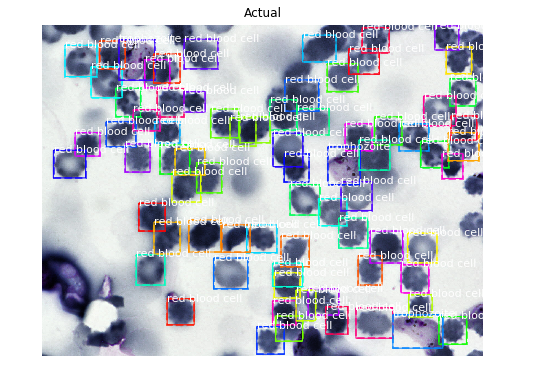

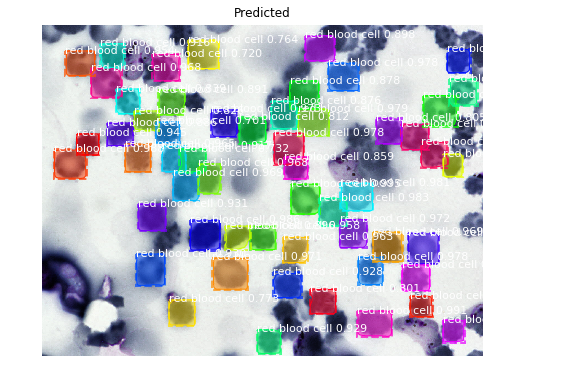

C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/003a89b0-a095-417a-8dd6-f408339bbc68.png


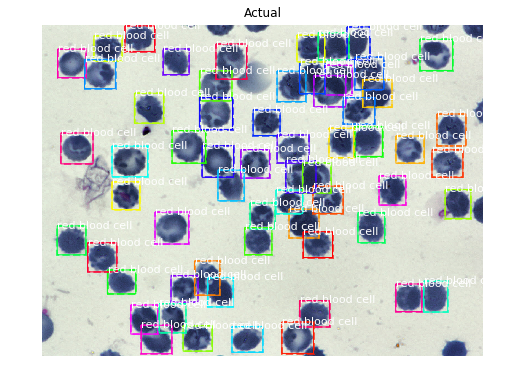

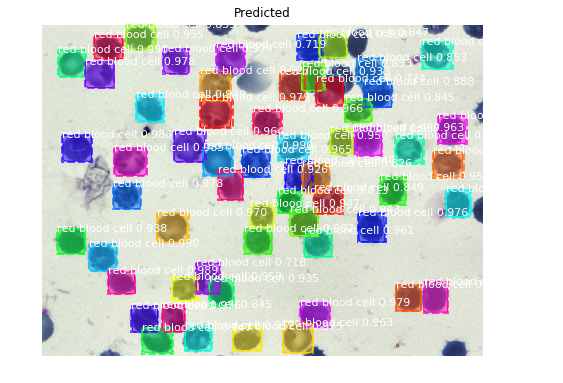

C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/003d1cdc-0aec-430b-90e0-f4d82135b1ac.png


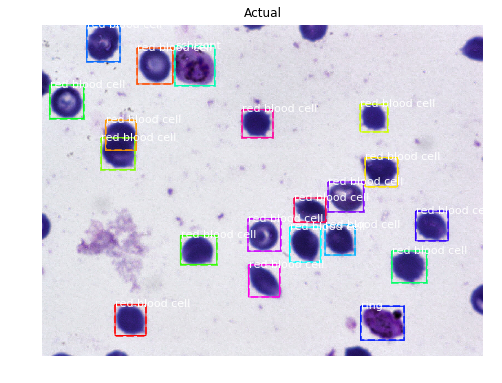

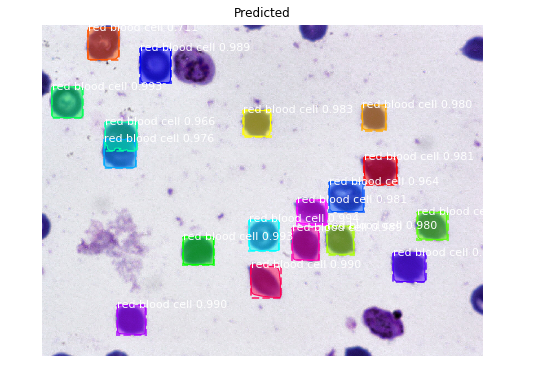

C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/005e60b6-77b8-458c-b57c-bfe0c7e7df78.png


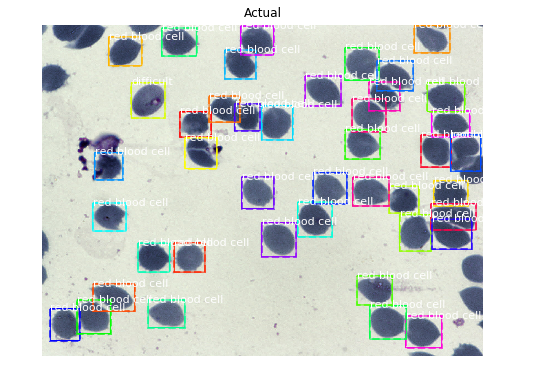

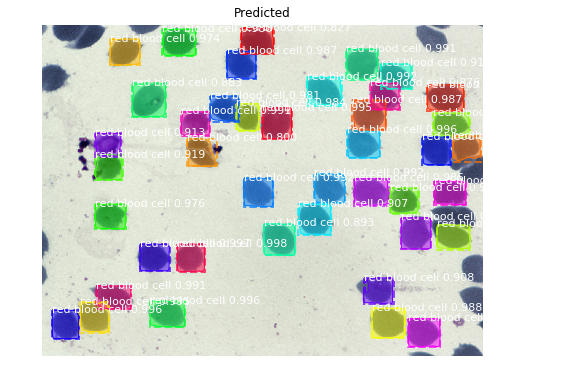

In [41]:
import warnings
warnings.filterwarnings("ignore")
# create config
config_pred = PredictionConfig(num_classes=8)
# define the model
model_eval = MaskRCNN(mode='inference', model_dir='./', config=config_pred)
# load model weights
model_eval.load_weights('mask_rcnn_malaria_cfg_0005.h5', by_name=True)
# plot predictions for train dataset
plot_actual_vs_predicted(train_set, model_eval, config_pred, n_images=4)


C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/010961af-b38c-49de-aca0-e3732d73d414.jpg
Loading image:  [1208]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/41be1bd3-0d31-4881-bf1f-3ccdfa21ff12.jpg


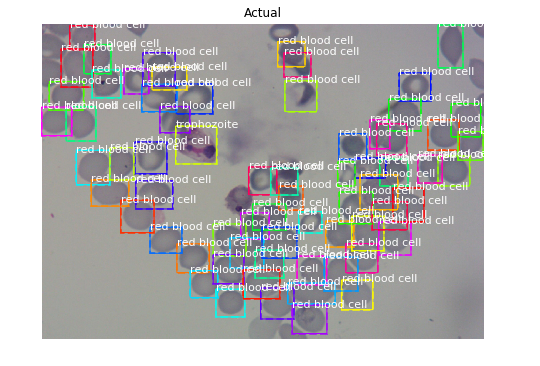

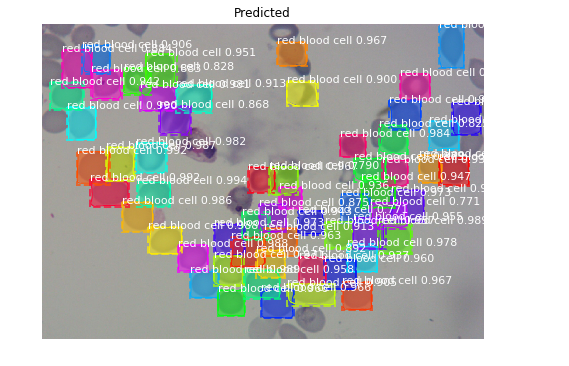

C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/0346611b-ea43-45bd-9f16-c6e8086273d2.jpg
Loading image:  [1209]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/64985a1e-16bb-4016-a01c-c21a5b86e572.jpg


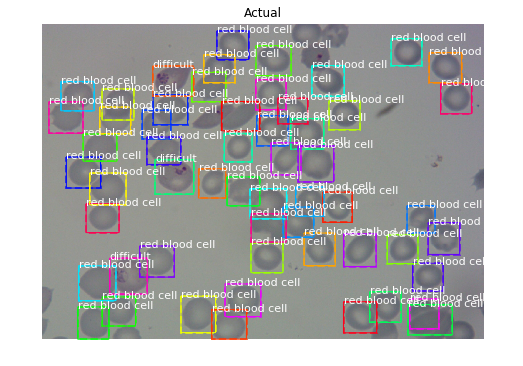

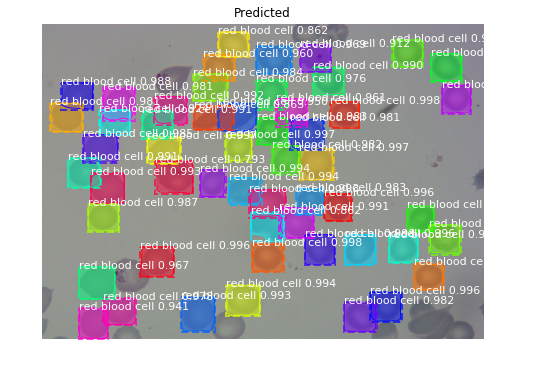

C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/03be08c8-2cf3-4de6-8ac6-5f7817a6a643.jpg
Loading image:  [1210]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/c70894fa-50e8-4eed-a5a8-159a20153a49.jpg


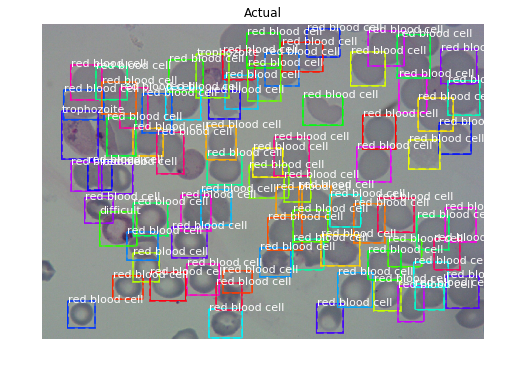

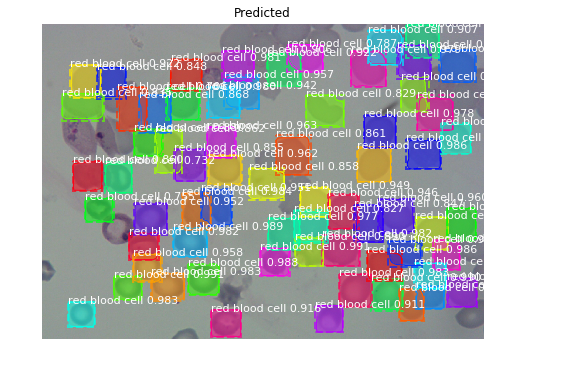

C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/06bbcd42-3ba8-4476-8804-8455f56dd928.jpg
Loading image:  [1211]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/abb72ce2-4193-4dd3-a34c-61c2ee22ccff.jpg


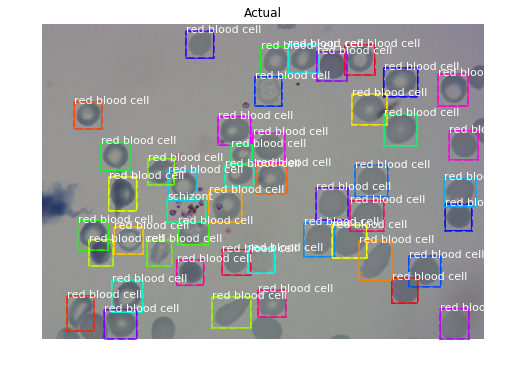

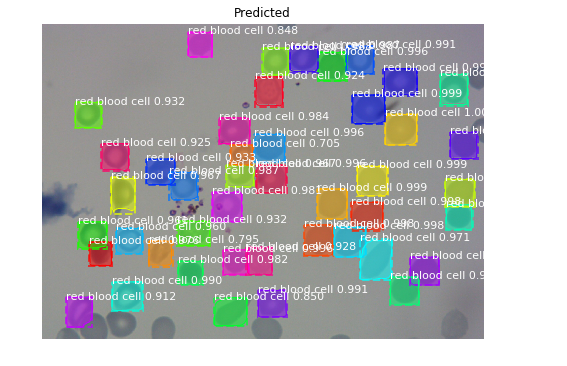

In [52]:
# plot predictions for test dataset
plot_actual_vs_predicted(test_set, model_eval, config_pred,  n_images=4)

# 10. Evaluate MAP metrics for dataset

The performance of a model for an object recognition task is often evaluated using the mAP and IOU.

The mask-rcnn library provides a mrcnn.utils.compute_ap to calculate the AP and other metrics for a given images. These AP scores can be collected across a dataset and the mean calculated to give an idea at how good the model is at detecting objects in a dataset.

In [42]:
# calculate the mAP for a model on a given dataset
def evaluate_model(dataset, model, cfg):
    APs = list()
    for image_id in dataset.image_ids:
        # load image, bounding boxes and masks for the image id
        image, image_meta, gt_class_id, gt_bbox, gt_mask = load_image_gt(dataset, cfg, image_id, use_mini_mask=False)
       # print(image, image_meta, gt_class_id, gt_bbox, gt_mask)
        # convert pixel values (e.g. center)
        scaled_image = mold_image(image, cfg)
        # convert image into one sample
        sample = expand_dims(scaled_image, 0)
        # make prediction
        yhat = model.detect(sample, verbose=0)
        # extract results for first sample
        r = yhat[0]
        #print(r)
        # calculate statistics, including AP
        """compute_ap: Compute Average Precision at a set IoU threshold (default 0.5).

            Returns:
            mAP: Mean Average Precision
            precisions: List of precisions at different class score thresholds.
            recalls: List of recall values at different class score thresholds.
            overlaps: [pred_boxes, gt_boxes] IoU overlaps.
            """
        #print( r["class_ids"])
        AP, _, _, _ = compute_ap(gt_bbox, gt_class_id, gt_mask, r["rois"], r["class_ids"], r["scores"], r['masks'])
        # store
        APs.append(AP)
    # calculate the mean AP across all images
    mAP = np.mean(APs)
    return mAP


In [ ]:
train_mAP = evaluate_model(train_set, model_eval, config_pred)

In [44]:
print("Train mAP: %.3f" % train_mAP)

Train mAP: 0.830


In [47]:
# evaluate model on test dataset
test_mAP = evaluate_model(test_set,  model_eval, config_pred)

In [45]:
print("Train mAP: %.3f" % test_mAP)

Train mAP: 0.806



# 11. Detect cells in new photos
I have downloaded some Malaria Cells image from internet and run model on these images.
These images are not part of training and test datasets.
Some, results are shown below.

In [74]:

def detect_cells(path):
    # load image
    image = imread(path)
    plt.imshow(image)
    # convert pixel values (e.g. center)
    scaled_image = mold_image(image, config_pred)
    # convert image into one sample
    sample = expand_dims(scaled_image, 0)
    # make prediction
    yhat = model_eval.detect(sample, verbose=0)[0]
    r = yhat
    print(r['class_ids'])
    print( r['scores'])
    display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                                train_set.class_names, r['scores'],title="Predicted",figsize=(16, 16))


[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 5 1 1 1 1 1 1]
[0.98285323 0.9490067  0.90494525 0.88189155 0.87026995 0.85721314
 0.85267895 0.84942406 0.8333291  0.831059   0.8224382  0.81369245
 0.8104189  0.7802584  0.7724985  0.769569   0.75980395 0.73407376
 0.7316328  0.72611564 0.7180116  0.7155901  0.71262527 0.712349
 0.7003585 ]


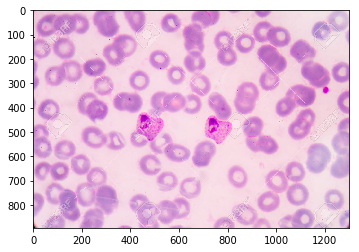

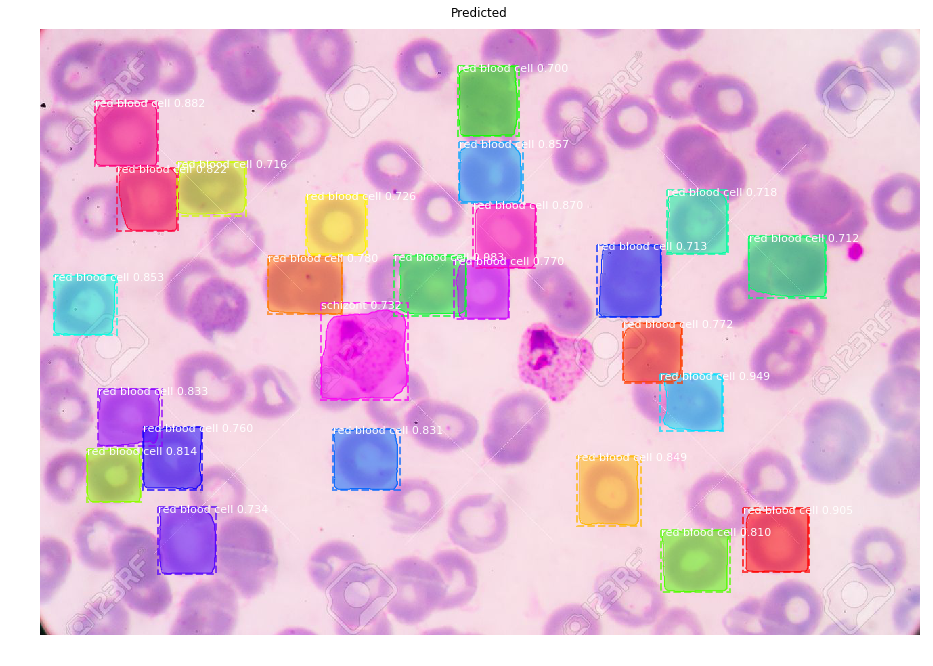

In [75]:
detect_cells("C:/Users/mukesh/Pictures/Saved Pictures/mask-rcnn/new8.jpg")

#### In above image, our model detecting 24 Red blood cells and 1 schizonts with score 0.7316

[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 5 1 1 2]
[0.9813958  0.97803557 0.9763692  0.9733508  0.9649282  0.9644976
 0.96368563 0.96258014 0.9595824  0.9562951  0.939252   0.93016136
 0.9267589  0.92569244 0.91195303 0.9079468  0.90220255 0.89297175
 0.88671523 0.8857458  0.8799423  0.8606073  0.8577857  0.855765
 0.811385   0.8094277  0.8082364  0.79895836 0.76888525 0.74270403
 0.74088126 0.721008  ]


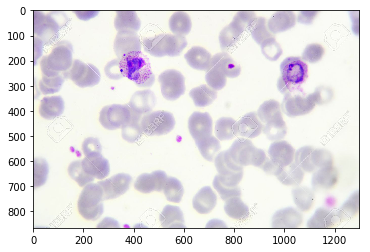

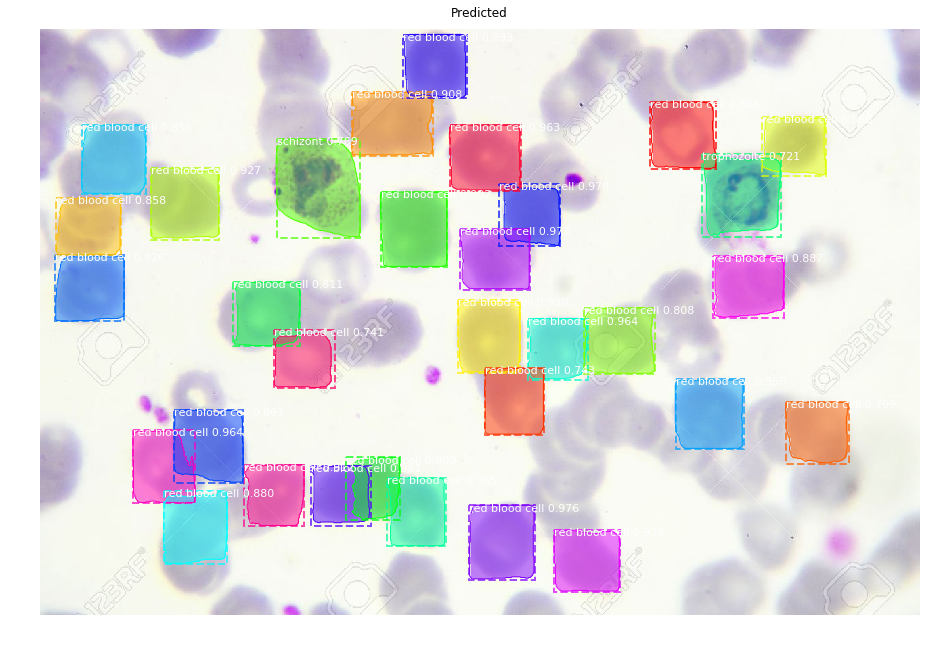

In [79]:
detect_cells("C:/Users/mukesh/Pictures/Saved Pictures/mask-rcnn/new10.jpg")

#### In above image, our model detecting 30 Red blood cells and 1 schizonts with score 0.76888525 and 1 trophozoite with score 0.721008